### Marwa Elmasri
October 2025

The data required for this analysis is as follows:\
actual_duration.csv with alias ad\
appointments_regional.csv with alias ar\
national_categories.xlsx with alias nc\
tweets.csv with alias tw\
\
Additional files:\
icb_names.xlsx with alias icb_names. This file is from the Office for National Statistics:\
https://www.nhsbsa.nhs.uk/sicbls-icbs-and-other-providers/organisation-and-prescriber-changes/sub-icb-locations

#

##### Libraries

In [1]:
# Import the necessary libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import datetime as dt
import calendar
import re

##### List of Functions.

In [2]:
# Determine the minimum and maximum dates in a dataFrame.
def get_minmax_dates(df, col):
    """ Get the minimum (earliest) and maximum (latest) dates in a dataframe column"""
    return df[col].agg(["min","max"])

In [3]:
# Function to get missing data, duplicated data, info, and shape of a dataframe.
def df_validation(df):

    # Check for missing values.
    missingval = df[df.isna().any(axis=1)]
    print(f"There are {len(missingval)} rows with missing values in the data.")

    # Check for duplicated data.
    dupdata = df.duplicated().sum()
    print(f"There are {dupdata} duplicated rows in the data.")

    # Check data types and shape.
    print("\nData info and Data Types:")
    print(df.info())
    print("\ndf shape:")
    print(ad.shape)

    # Check useful statistics.
    print("\nSummary statistics:")
    print(ad.describe())

In [4]:
# Function to clean labels: turn _ into space.
def clean_label(label):
    return label.replace('_', ' ').title()

In [5]:
# Function to generate a histplot
def generate_histplot(df, x, title, xmin, xmax, ymin, ymax, **kwargs):
    x_label = clean_label(x)
    
    histo = sns.histplot(data=df, x=x, **kwargs)
    plt.title(title)
    plt.xlabel(x_label)
    # axes limits
    histo.set_xlim(xmin, xmax)
    histo.set_ylim(ymin, ymax)
    
    plt.tight_layout()
    return histo

In [6]:
# Function to generate a barplot
def generate_barplot(df, x, y, title, xlab, ylab, format_axis="y", scale="M", **kwargs):

    bar = sns.barplot(data=df, x=x, y=y, **kwargs)
    plt.title(title)
    bar.set_xlabel(xlab)
    bar.set_ylabel(ylab)
    
    # Determine scale factor: 1000 (K) or 1mil (M)
    scale = scale.upper() if isinstance(scale, str) else None
    if scale == "K":
        divisor, suffix = 1e3, "K"
    elif scale == "M":
        divisor, suffix = 1e6, "M"
    else:
        divisor, suffix = None, ""

    # Apply formatting if needed
    if divisor and format_axis == "y":
        bar.yaxis.set_major_formatter(
            mtick.FuncFormatter(lambda val, _: f"{int(val/divisor)}{suffix}")
        )
    elif divisor and format_axis == "x":
        bar.xaxis.set_major_formatter(
            mtick.FuncFormatter(lambda val, _: f"{int(val/divisor)}{suffix}")
        )

    plt.tight_layout()
    return bar

In [7]:
# Function to generate a lineplot
def generate_lineplot(df, x, y, title, xlab, ylab, format_axis="y", scale="M", **kwargs):

    line = sns.lineplot(data=df, x=x, y=y, **kwargs)
    plt.title(title)
    line.set_xlabel(xlab)
    line.set_ylabel(ylab)
    
    # Determine scale factor: 1000 (K) or 1mil (M)
    scale = scale.upper() if isinstance(scale, str) else None
    if scale == "K":
        divisor, suffix = 1e3, "K"
    elif scale == "M":
        divisor, suffix = 1e6, "M"
    else:
        divisor, suffix = None, ""

    # Apply formatting if needed
    if divisor and format_axis == "y":
        line.yaxis.set_major_formatter(
            mtick.FuncFormatter(lambda val, _: f"{int(val/divisor)}{suffix}")
        )
    elif divisor and format_axis == "x":
        line.xaxis.set_major_formatter(
            mtick.FuncFormatter(lambda val, _: f"{int(val/divisor)}{suffix}")
        )

    plt.tight_layout()
    return line

In [8]:
# Function to count working days (Mon–Fri excluding holidays)
def working_days_excl_holidays(date):
    year, month = date.year, date.month
    _, num_days = calendar.monthrange(year, month)
    days = pd.date_range(start=f"{year}-{month:02d}-01", periods=num_days, freq="D")
    weekdays = days[days.weekday < 5]
    weekdays = weekdays[~weekdays.isin(bank_holidays)]
    return len(weekdays)

#

### AD (Actual Duration) import and data inspection/cleaning

In [9]:
# Import the data actual_duration as ad.
ad = pd.read_csv("actual_duration.csv")

# Inspect the data.
ad.head()

,sub_icb_location_code,sub_icb_location_ons_code,sub_icb_location_name,icb_ons_code,region_ons_code,appointment_date,actual_duration,count_of_appointments
0,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,31-60 Minutes,364
1,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,21-30 Minutes,619
2,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,6-10 Minutes,1698
3,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,Unknown / Data Quality,1277
4,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,01-Dec-21,16-20 Minutes,730


In [10]:
# Use the df_validation function to inspect the dataframe
df_validation(ad)

There are 0 rows with missing values in the data.
There are 0 duplicated rows in the data.

Data info and Data Types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137793 entries, 0 to 137792
Data columns (total 8 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   sub_icb_location_code      137793 non-null  object
 1   sub_icb_location_ons_code  137793 non-null  object
 2   sub_icb_location_name      137793 non-null  object
 3   icb_ons_code               137793 non-null  object
 4   region_ons_code            137793 non-null  object
 5   appointment_date           137793 non-null  object
 6   actual_duration            137793 non-null  object
 7   count_of_appointments      137793 non-null  int64 
dtypes: int64(1), object(7)
memory usage: 8.4+ MB
None

df shape:
(137793, 8)

Summary statistics:
       count_of_appointments
count          137793.000000
mean             1219.080011
std              1546.9029

In [11]:
# Change appointment_date to datetime.
ad["appointment_date"] = pd.to_datetime(ad["appointment_date"], format="%d-%b-%y")
ad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137793 entries, 0 to 137792
Data columns (total 8 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   sub_icb_location_code      137793 non-null  object        
 1   sub_icb_location_ons_code  137793 non-null  object        
 2   sub_icb_location_name      137793 non-null  object        
 3   icb_ons_code               137793 non-null  object        
 4   region_ons_code            137793 non-null  object        
 5   appointment_date           137793 non-null  datetime64[ns]
 6   actual_duration            137793 non-null  object        
 7   count_of_appointments      137793 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(6)
memory usage: 8.4+ MB


The ad date range is 2021-12-01 to 2022-06-30.

#

### AR (Appointments Regional) import and data inspection/cleaning

In [12]:
# Import the data appointments_regional.csv as ar.
ar = pd.read_csv("appointments_regional.csv")

# Inspect the data.
ar.head()

,icb_ons_code,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments
0,E54000034,2020-01,Attended,GP,Face-to-Face,1 Day,8107
1,E54000034,2020-01,Attended,GP,Face-to-Face,15 to 21 Days,6791
2,E54000034,2020-01,Attended,GP,Face-to-Face,2 to 7 Days,20686
3,E54000034,2020-01,Attended,GP,Face-to-Face,22 to 28 Days,4268
4,E54000034,2020-01,Attended,GP,Face-to-Face,8 to 14 Days,11971


In [13]:
# Check the unique column names in hcp_type.
ar["hcp_type"].unique()

array(['GP', 'Other Practice staff', 'Unknown'], dtype=object)

In [14]:
# Use the df_validation function to inspect the dataframe
df_validation(ar)

There are 0 rows with missing values in the data.
There are 21604 duplicated rows in the data.

Data info and Data Types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596821 entries, 0 to 596820
Data columns (total 7 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       596821 non-null  object
 1   appointment_month                  596821 non-null  object
 2   appointment_status                 596821 non-null  object
 3   hcp_type                           596821 non-null  object
 4   appointment_mode                   596821 non-null  object
 5   time_between_book_and_appointment  596821 non-null  object
 6   count_of_appointments              596821 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 31.9+ MB
None

df shape:
(137793, 8)

Summary statistics:
                    appointment_date  count_of_appointments
count                         13

In [15]:
# Remove duplicated rows.
ar_unique = ar.drop_duplicates().copy()
ar_dup = ar_unique.duplicated().sum()
print(f"There are {ar_dup} duplicated rows in ar_unique.")

There are 0 duplicated rows in ar_unique.


In [16]:
# Use the df_validation function to inspect ar_unique
df_validation(ar_unique)

There are 0 rows with missing values in the data.
There are 0 duplicated rows in the data.

Data info and Data Types:
<class 'pandas.core.frame.DataFrame'>
Index: 575217 entries, 0 to 596819
Data columns (total 7 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       575217 non-null  object
 1   appointment_month                  575217 non-null  object
 2   appointment_status                 575217 non-null  object
 3   hcp_type                           575217 non-null  object
 4   appointment_mode                   575217 non-null  object
 5   time_between_book_and_appointment  575217 non-null  object
 6   count_of_appointments              575217 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 35.1+ MB
None

df shape:
(137793, 8)

Summary statistics:
                    appointment_date  count_of_appointments
count                         137793     

In [17]:
# Change appointment_month to datetime then make a new column with period[M].
ar_unique["appointment_month"] = pd.to_datetime(ar_unique["appointment_month"], format="%Y-%m")
ar_unique["appointment_month_M"] = ar_unique["appointment_month"].dt.to_period("M")
ar_unique.info()


<class 'pandas.core.frame.DataFrame'>
Index: 575217 entries, 0 to 596819
Data columns (total 8 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   icb_ons_code                       575217 non-null  object        
 1   appointment_month                  575217 non-null  datetime64[ns]
 2   appointment_status                 575217 non-null  object        
 3   hcp_type                           575217 non-null  object        
 4   appointment_mode                   575217 non-null  object        
 5   time_between_book_and_appointment  575217 non-null  object        
 6   count_of_appointments              575217 non-null  int64         
 7   appointment_month_M                575217 non-null  period[M]     
dtypes: datetime64[ns](1), int64(1), object(5), period[M](1)
memory usage: 39.5+ MB


The ar_unique date range is 2020-01-01 to 2022-06-01.

#

### NC (National Categories) import and data inspection/cleaning

In [18]:
# Import the data national_categories as nc.
nc = pd.read_excel("national_categories.xlsx")

# Inspect the data.
nc.head()

,appointment_date,icb_ons_code,sub_icb_location_name,service_setting,context_type,national_category,count_of_appointments,appointment_month
0,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,Primary Care Network,Care Related Encounter,Patient contact during Care Home Round,3,2021-08
1,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,Other,Care Related Encounter,Planned Clinics,7,2021-08
2,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,Home Visit,79,2021-08
3,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,General Consultation Acute,725,2021-08
4,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,Structured Medication Review,2,2021-08


In [19]:
# Use the df_validation function to inspect the dataframe
df_validation(nc)

There are 0 rows with missing values in the data.
There are 0 duplicated rows in the data.

Data info and Data Types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817394 entries, 0 to 817393
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   appointment_date       817394 non-null  datetime64[ns]
 1   icb_ons_code           817394 non-null  object        
 2   sub_icb_location_name  817394 non-null  object        
 3   service_setting        817394 non-null  object        
 4   context_type           817394 non-null  object        
 5   national_category      817394 non-null  object        
 6   count_of_appointments  817394 non-null  int64         
 7   appointment_month      817394 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(6)
memory usage: 49.9+ MB
None

df shape:
(137793, 8)

Summary statistics:
                    appointment_date  count_of_appoin

In [20]:
# Change appointment_month to datetime then make a new column with period[M].
nc["appointment_month"] = pd.to_datetime(nc["appointment_month"], format="%Y-%m")
nc["appointment_month_M"] = nc["appointment_month"].dt.to_period("M")
nc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817394 entries, 0 to 817393
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   appointment_date       817394 non-null  datetime64[ns]
 1   icb_ons_code           817394 non-null  object        
 2   sub_icb_location_name  817394 non-null  object        
 3   service_setting        817394 non-null  object        
 4   context_type           817394 non-null  object        
 5   national_category      817394 non-null  object        
 6   count_of_appointments  817394 non-null  int64         
 7   appointment_month      817394 non-null  datetime64[ns]
 8   appointment_month_M    817394 non-null  period[M]     
dtypes: datetime64[ns](2), int64(1), object(5), period[M](1)
memory usage: 56.1+ MB


In [21]:
nc.describe()

,appointment_date,count_of_appointments,appointment_month
count,817394,817394.000000,817394
mean,2022-01-16 00:50:35.860796160,362.183684,2022-01-01 07:17:28.394287616
min,2021-08-01 00:00:00,1.000000,2021-08-01 00:00:00
25%,2021-10-25 00:00:00,7.000000,2021-10-01 00:00:00
50%,2022-01-18 00:00:00,25.000000,2022-01-01 00:00:00
75%,2022-04-07 00:00:00,128.000000,2022-04-01 00:00:00
max,2022-06-30 00:00:00,16590.000000,2022-06-01 00:00:00
std,NaN,1084.576600,NaN


The nc date range is 2021-08-01 to 2022-06-30.

#

### Tweets data

In [22]:
# Load the data set.
tweet = pd.read_csv("tweets.csv")

# View the DataFrame.
tweet.head()

,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
0,1567629223795527681,As Arkansas’ first Comprehensive Stroke Certif...,"{'hashtags': [{'text': 'Healthcare', 'indices'...",#Healthcare,"{'iso_language_code': 'en', 'result_type': 're...",0,0,False,False,en
1,1567582846612553728,RT @AndreaGrammer: Work-life balance is at the...,"{'hashtags': [{'text': 'PremiseHealth', 'indic...","#PremiseHealth, #hiring","{'iso_language_code': 'en', 'result_type': 're...",2,0,False,False,en
2,1567582787070304256,RT @OntarioGreens: $10 billion can go a long w...,"{'hashtags': [{'text': 'Healthcare', 'indices'...",#Healthcare,"{'iso_language_code': 'en', 'result_type': 're...",39,0,False,False,en
3,1567582767625428992,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies...,"{'hashtags': [{'text': 'NEW', 'indices': [20, ...",#NEW,"{'iso_language_code': 'en', 'result_type': 're...",5,0,False,False,en
4,1567582720460570625,ICYMI: Our recent blogs on Cybersecurity in Ac...,"{'hashtags': [{'text': 'blogs', 'indices': [18...","#blogs, #digitaltransformation, #cybersecurity...","{'iso_language_code': 'en', 'result_type': 're...",0,0,False,False,en


tweet_favorited and tweet_retweeted dont match the count. It still says False when count is greater than Zero.
Not useful columns.

In [23]:
# Check for duplicated data.
tweets_dup = tweet.duplicated().sum()
print(f"There are {tweets_dup} duplicated rows in tweet.")

There are 0 duplicated rows in tweet.


In [24]:
# Check data types and shape.
tweet.info()
print(tweet.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1174 entries, 0 to 1173
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   tweet_id                 1174 non-null   int64 
 1   tweet_full_text          1174 non-null   object
 2   tweet_entities           1174 non-null   object
 3   tweet_entities_hashtags  1007 non-null   object
 4   tweet_metadata           1174 non-null   object
 5   tweet_retweet_count      1174 non-null   int64 
 6   tweet_favorite_count     1174 non-null   int64 
 7   tweet_favorited          1174 non-null   bool  
 8   tweet_retweeted          1174 non-null   bool  
 9   tweet_lang               1174 non-null   object
dtypes: bool(2), int64(3), object(5)
memory usage: 75.8+ KB
(1174, 10)


#

### Import icb_names data

In [25]:
# Import the data.
icb_names = pd.read_excel("icb_names.xlsx")
# view the first 5 rows of the data
icb_names.head()

,Sub ICB Location ODS Code,Sub ICB Location Name,Sub ICB Location Non-Primary Role,ICB Code,Integrated Care Board Name,ICB Non-Primary Role,Region Code,Region Name
0,92G,"NHS BATH AND NORTH EAST SOMERSET, SWINDON AND ...",SUB ICB LOCATION,QOX,"NHS BATH AND NORTH EAST SOMERSET, SWINDON AND ...",INTEGRATED CARE BOARD,Y58,SOUTH WEST COMMISSIONING REGION
1,M1J4Y,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES ICB ...",SUB ICB LOCATION,QHG,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",INTEGRATED CARE BOARD,Y61,EAST OF ENGLAND COMMISSIONING REGION
2,15E,NHS BIRMINGHAM AND SOLIHULL ICB - 15E,SUB ICB LOCATION,QHL,NHS BIRMINGHAM AND SOLIHULL INTEGRATED CARE BOARD,INTEGRATED CARE BOARD,Y60,MIDLANDS COMMISSIONING REGION
3,D2P2L,NHS BLACK COUNTRY ICB - D2P2L,SUB ICB LOCATION,QUA,NHS BLACK COUNTRY INTEGRATED CARE BOARD,INTEGRATED CARE BOARD,Y60,MIDLANDS COMMISSIONING REGION
4,15C,"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCEST...",SUB ICB LOCATION,QUY,"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCEST...",INTEGRATED CARE BOARD,Y58,SOUTH WEST COMMISSIONING REGION


In [26]:
# Check for missing values.
icb_na = icb_names[icb_names.isna().any(axis=1)]
print(f"There are {len(icb_na)} rows with missing values in icb_names.")

There are 0 rows with missing values in icb_names.


In [27]:
# Check for duplicated data.
icb_dup = icb_names.duplicated().sum()
print(f"There are {icb_dup} duplicated rows in icb_names.")

There are 0 duplicated rows in icb_names.


In [28]:
# Remove the spaces from column titles.
icb_names.columns = icb_names.columns.str.strip()
icb_names.columns

Index(['Sub ICB Location ODS Code', 'Sub ICB Location Name',
       'Sub ICB Location Non-Primary Role', 'ICB Code',
       'Integrated Care Board Name', 'ICB Non-Primary Role', 'Region Code',
       'Region Name'],
      dtype='object')

In [29]:
# Add Integrated Care Board Name and Region Name to ad, ar_unique, and nc.
# Use merge.
ad = pd.merge(ad, icb_names[["Sub ICB Location ODS Code", "Integrated Care Board Name", "Region Name"]],
              how="left",
              left_on="sub_icb_location_code",
              right_on="Sub ICB Location ODS Code")
ad.head()

,sub_icb_location_code,sub_icb_location_ons_code,sub_icb_location_name,icb_ons_code,region_ons_code,appointment_date,actual_duration,count_of_appointments,Sub ICB Location ODS Code,Integrated Care Board Name,Region Name
0,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,2021-12-01,31-60 Minutes,364,00L,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
1,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,2021-12-01,21-30 Minutes,619,00L,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
2,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,2021-12-01,6-10 Minutes,1698,00L,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
3,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,2021-12-01,Unknown / Data Quality,1277,00L,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
4,00L,E38000130,NHS North East and North Cumbria ICB - 00L,E54000050,E40000012,2021-12-01,16-20 Minutes,730,00L,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION


In [30]:
# Simplify the subsequent merges, create a unique dataset with icb_ons_code, ICB name and Region Name.
unique_subset = ad[["icb_ons_code", "Integrated Care Board Name", "Region Name"]].drop_duplicates()
unique_subset.head()

,icb_ons_code,Integrated Care Board Name,Region Name
0,E54000050,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
3383,E54000048,NHS LANCASHIRE AND SOUTH CUMBRIA INTEGRATED CA...,NORTH WEST COMMISSIONING REGION
5729,E54000057,NHS GREATER MANCHESTER INTEGRATED CARE BOARD,NORTH WEST COMMISSIONING REGION
14595,E54000008,NHS CHESHIRE AND MERSEYSIDE INTEGRATED CARE BOARD,NORTH WEST COMMISSIONING REGION
32345,E54000061,NHS SOUTH YORKSHIRE INTEGRATED CARE BOARD,NORTH EAST AND YORKSHIRE COMMISSIONING REGION


In [31]:
# Merge the unique_subset to ar_unique.
ar_unique = pd.merge(ar_unique, unique_subset[["icb_ons_code", "Integrated Care Board Name", "Region Name"]],
              how="left",
              on="icb_ons_code")
ar_unique.head()

,icb_ons_code,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments,appointment_month_M,Integrated Care Board Name,Region Name
0,E54000034,2020-01-01,Attended,GP,Face-to-Face,1 Day,8107,2020-01,NHS FRIMLEY INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION
1,E54000034,2020-01-01,Attended,GP,Face-to-Face,15 to 21 Days,6791,2020-01,NHS FRIMLEY INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION
2,E54000034,2020-01-01,Attended,GP,Face-to-Face,2 to 7 Days,20686,2020-01,NHS FRIMLEY INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION
3,E54000034,2020-01-01,Attended,GP,Face-to-Face,22 to 28 Days,4268,2020-01,NHS FRIMLEY INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION
4,E54000034,2020-01-01,Attended,GP,Face-to-Face,8 to 14 Days,11971,2020-01,NHS FRIMLEY INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION


In [32]:
# Merge the unique_subset to nc.
nc = pd.merge(nc, unique_subset[["icb_ons_code", "Integrated Care Board Name", "Region Name"]],
              how="left",
              on="icb_ons_code")
nc.head()

,appointment_date,icb_ons_code,sub_icb_location_name,service_setting,context_type,national_category,count_of_appointments,appointment_month,appointment_month_M,Integrated Care Board Name,Region Name
0,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,Primary Care Network,Care Related Encounter,Patient contact during Care Home Round,3,2021-08-01,2021-08,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
1,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,Other,Care Related Encounter,Planned Clinics,7,2021-08-01,2021-08,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
2,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,Home Visit,79,2021-08-01,2021-08,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
3,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,General Consultation Acute,725,2021-08-01,2021-08,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION
4,2021-08-02,E54000050,NHS North East and North Cumbria ICB - 00L,General Practice,Care Related Encounter,Structured Medication Review,2,2021-08-01,2021-08,NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CA...,NORTH EAST AND YORKSHIRE COMMISSIONING REGION


#

### Data Exploration

In [33]:
# Determine the number of locations.
print(f"There are {len(ad["sub_icb_location_name"].unique())} sub ICB locations,\
 {len(ad["icb_ons_code"].unique())} ICB locations, and\
 {len(ad["region_ons_code"].unique())} regions.")

There are 106 sub ICB locations, 42 ICB locations, and 7 regions.


In [34]:
# Determine the top five locations based on appointment count, grouped by sub_icb for ad.
top5_ad = ad.groupby(["sub_icb_location_name"])["count_of_appointments"].sum().sort_values(ascending=False)
top5_ad.head()

sub_icb_location_name
NHS North West London ICB - W2U3Z              6976986
NHS North East London ICB - A3A8R              5341883
NHS Kent and Medway ICB - 91Q                  5209641
NHS Hampshire and Isle Of Wight ICB - D9Y0V    4712737
NHS South East London ICB - 72Q                4360079
Name: count_of_appointments, dtype: int64

In [35]:
# Determine the top five locations based on appointment count, grouped by sub_icb for nc.
top5_nc = nc.groupby(["sub_icb_location_name"])["count_of_appointments"].sum().sort_values(ascending=False)
top5_nc.head()
# The top 5 are the same for ad and nc datasets

sub_icb_location_name
NHS North West London ICB - W2U3Z              12142390
NHS North East London ICB - A3A8R               9588891
NHS Kent and Medway ICB - 91Q                   9286167
NHS Hampshire and Isle Of Wight ICB - D9Y0V     8288102
NHS South East London ICB - 72Q                 7850170
Name: count_of_appointments, dtype: int64

In [36]:
# Determine the top five locations based on appointment count, grouped by icb_ons_code for ar_unique.
top5_ar = ar_unique.groupby(
    ["Integrated Care Board Name"])["count_of_appointments"].sum().sort_values(ascending=False)
top5_ar.head()

Integrated Care Board Name
NHS NORTH EAST AND NORTH CUMBRIA INTEGRATED CARE BOARD    43054121
NHS WEST YORKSHIRE INTEGRATED CARE BOARD                  36075020
NHS GREATER MANCHESTER INTEGRATED CARE BOARD              34003953
NHS CHESHIRE AND MERSEYSIDE INTEGRATED CARE BOARD         33064205
NHS NORTH WEST LONDON INTEGRATED CARE BOARD               29380767
Name: count_of_appointments, dtype: int64

In [37]:
# Determine the number of service settings.
print(nc["service_setting"].unique())
print(len(nc["service_setting"].unique()))

['Primary Care Network' 'Other' 'General Practice' 'Unmapped'
 'Extended Access Provision']
5


In [38]:
# Determine the number of context types.
print(nc["context_type"].unique())
print(len(nc["context_type"].unique()))

['Care Related Encounter' 'Unmapped' 'Inconsistent Mapping']
3


Context types only have one informative category.

In [39]:
# Determine the number of national categories.
print(nc["national_category"].unique())
print(len(nc["national_category"].unique()))

['Patient contact during Care Home Round' 'Planned Clinics' 'Home Visit'
 'General Consultation Acute' 'Structured Medication Review'
 'Care Home Visit' 'Unmapped' 'Clinical Triage'
 'Planned Clinical Procedure' 'Inconsistent Mapping'
 'Care Home Needs Assessment & Personalised Care and Support Planning'
 'General Consultation Routine'
 'Service provided by organisation external to the practice'
 'Unplanned Clinical Activity' 'Social Prescribing Service'
 'Non-contractual chargeable work'
 'Group Consultation and Group Education' 'Walk-in']
18


In [40]:
# Determine the number of appointment statuses.
print(ar["appointment_status"].unique())
print(len(ar["appointment_status"].unique()))

['Attended' 'DNA' 'Unknown']
3


In [41]:
# Get min and max for ad using get_minmax_dates function.
get_minmax_dates(ad, "appointment_date")

min   2021-12-01
max   2022-06-30
Name: appointment_date, dtype: datetime64[ns]

In [42]:
# Determine the min and max dates in the nc dataFrame using get_minmax_dates function.
get_minmax_dates(nc, "appointment_date")

min   2021-08-01
max   2022-06-30
Name: appointment_date, dtype: datetime64[ns]

In [43]:
# Determine the min and max dates in the ar_unique dataFrame using get_minmax_dates function.
get_minmax_dates(ar_unique, "appointment_month")

min   2020-01-01
max   2022-06-01
Name: appointment_month, dtype: datetime64[ns]

#

### Data Visualisation

In [44]:
# Set figure size.
sns.set(rc={"figure.figsize":(15, 6)})
# Set text size.
sns.set_context("talk")
# Set the plot style as white with grey grid lines.
sns.set_style("whitegrid", {
    "grid.color": ".97",
    "grid.linestyle": "-",
    "axes.edgecolor": "0.4"})

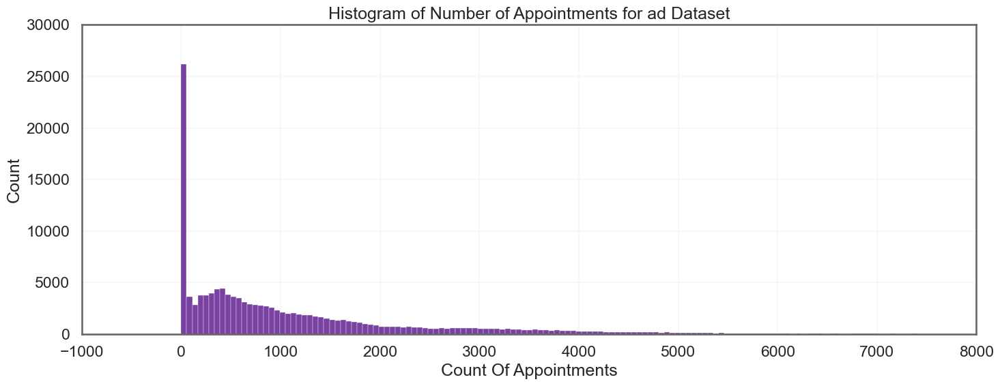

In [45]:
# Check the distribution of numerical columns with a histogram.
# ad data.
# Use generate_histplot function.
generate_histplot(ad,
                  x="count_of_appointments",
                  title="Histogram of Number of Appointments for ad Dataset",
                  xmin=-1000,
                  xmax=8000,
                  ymin=0,
                  ymax=30000,
                  color="Indigo"
                 )
plt.show()

ad appointment count is skewed with a right tail. The axis is limited at 8000 but there are more datapoints beyond. This and subsequent histograms just illustrate the majority of data.

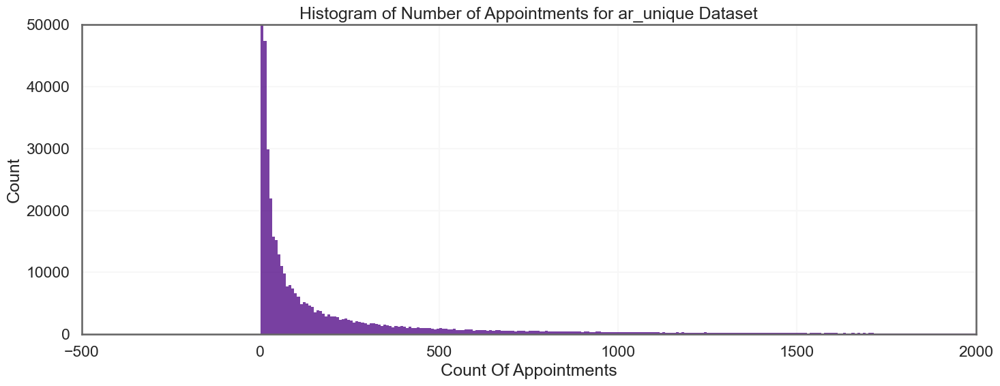

In [46]:
# Check the distribution of numerical columns with a histogram.
# ar_unique data.
# Use generate_histplot function.
generate_histplot(ar_unique,
                  x="count_of_appointments",
                  title="Histogram of Number of Appointments for ar_unique Dataset",
                  xmin=-500,
                  xmax=2000,
                  ymin=0,
                  ymax=50000,
                  color="Indigo"
                 )
plt.show()

ar_unique dataset highest point is ~150K so the y axis has been cut to 50K to see the rest of the data in detail. Again there is a right tail with a lot of reports of high numbers of appointments.

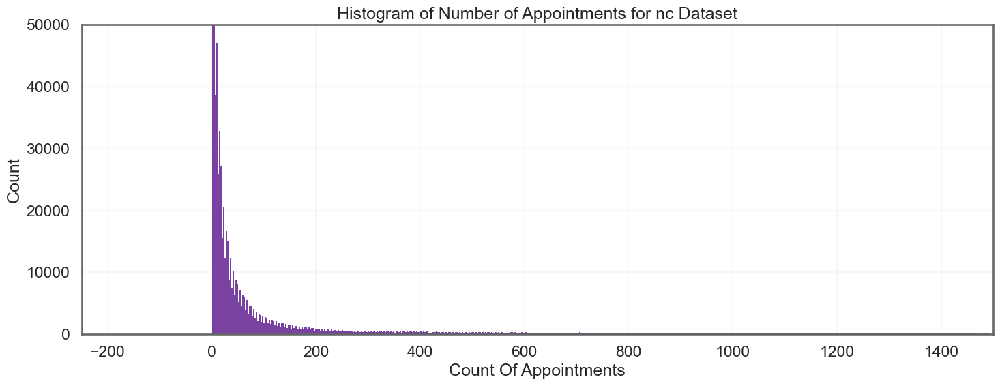

In [47]:
# Check the distribution of numerical columns with a histogram.
# nc data.
# Use generate_histplot function.
generate_histplot(nc,
                  x="count_of_appointments",
                  title="Histogram of Number of Appointments for nc Dataset",
                  xmin=-250,
                  xmax=1500,
                  ymin=0,
                  ymax=50000,
                  color="Indigo"
                 )
plt.show()

There is the same trend here too. Notice the tiny bars at higher x axis values.

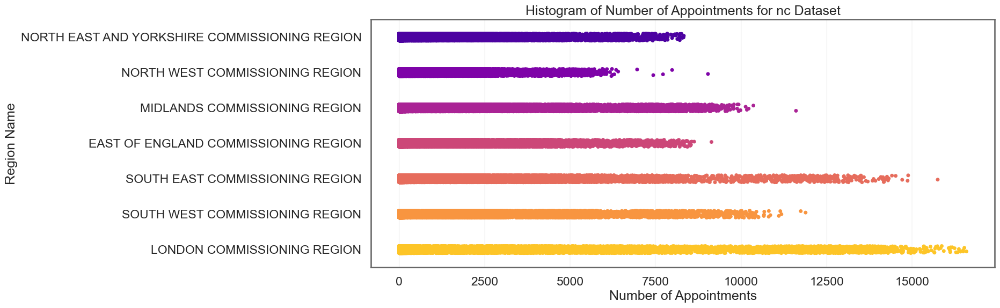

In [48]:
# Check the distribution of appointments by region.
s_nc = sns.stripplot(nc,
                     x="count_of_appointments",
                     y= "Region Name",
                     hue="Region Name",
                     palette="plasma")

# Set axes labels.
s_nc.set_xlabel("Number of Appointments")
s_nc.set_title("Histogram of Number of Appointments for nc Dataset")

plt.show()

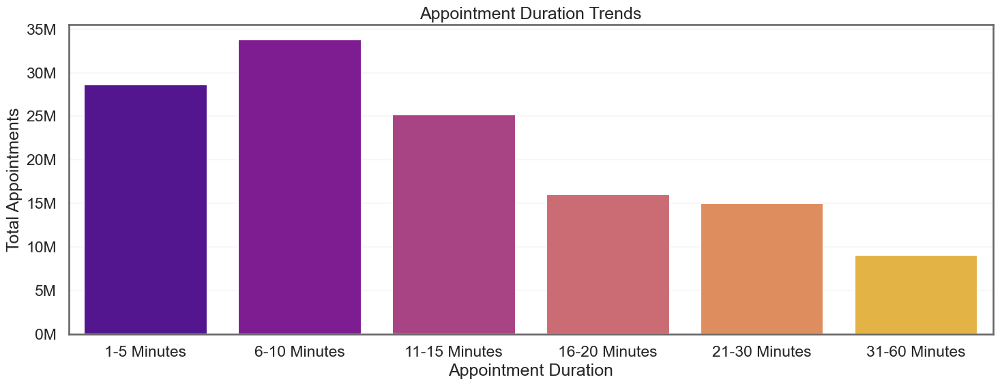

In [49]:
# Bar plot showing the sum of appointment durations.
# Filter ad without "unknown/data quality".
ad_no_unknown = ad[ad["actual_duration"] != "Unknown / Data Quality"]

# Set the order of bars in the plot.
bar_order = ["1-5 Minutes",
             "6-10 Minutes",
             "11-15 Minutes",
             "16-20 Minutes",
             "21-30 Minutes",
             "31-60 Minutes"]

# Use function to get barplot
generate_barplot(df=ad_no_unknown,
                     x="actual_duration",
                     y="count_of_appointments",
                     title="Appointment Duration Trends",
                     xlab="Appointment Duration",
                     ylab="Total Appointments",
                     estimator=np.sum,
                     order=bar_order,
                     errorbar=None,
                     hue="actual_duration",
                     hue_order=bar_order,
                     legend=False,
                     palette="plasma")
plt.show()

Most appointments last 6-10 minutes, longer appointments are less frequent.

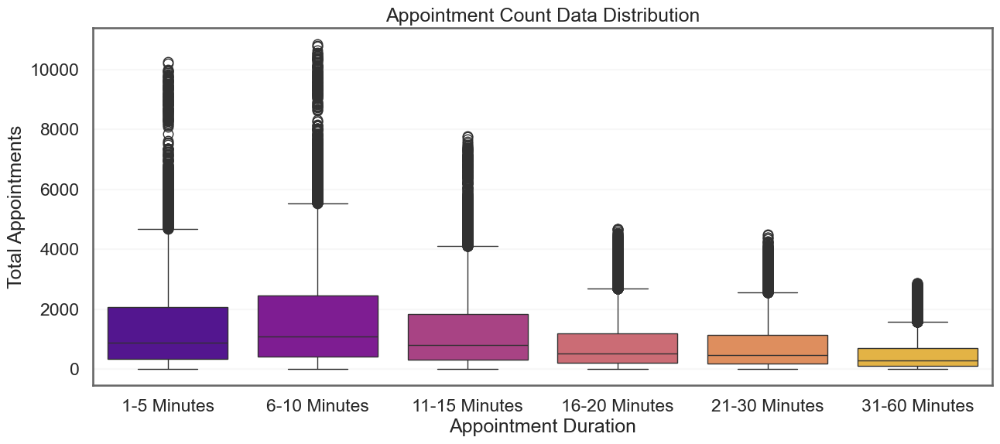

In [50]:
# Check the appointment count with a boxplot.
bp = sns.boxplot(ad_no_unknown,
                 y= "count_of_appointments",
                 x="actual_duration",
                 order=bar_order,
                 hue="actual_duration",
                 hue_order=bar_order,
                 palette="plasma")

# Add labels.
bp.set_xlabel("Appointment Duration")
bp.set_ylabel("Total Appointments")
bp.set_title("Appointment Count Data Distribution")

plt.show()

There are so many outliers that are seen on both the histogram tails and boxplot.
These are only plotted against categorical or date data so will not be an issue.

#

In [51]:
# Check the region names in the dataframe.
ad_no_unknown["Region Name"].unique()

array(['NORTH EAST AND YORKSHIRE COMMISSIONING REGION',
       'NORTH WEST COMMISSIONING REGION', 'MIDLANDS COMMISSIONING REGION',
       'EAST OF ENGLAND COMMISSIONING REGION',
       'SOUTH EAST COMMISSIONING REGION',
       'SOUTH WEST COMMISSIONING REGION', 'LONDON COMMISSIONING REGION'],
      dtype=object)

In [52]:
# Set the order for future plots for colour of regions.
region_hue =["MIDLANDS COMMISSIONING REGION",
             "NORTH EAST AND YORKSHIRE COMMISSIONING REGION",
             "SOUTH EAST COMMISSIONING REGION",
             "LONDON COMMISSIONING REGION",
             "EAST OF ENGLAND COMMISSIONING REGION",
             "SOUTH WEST COMMISSIONING REGION",
             "NORTH WEST COMMISSIONING REGION"]

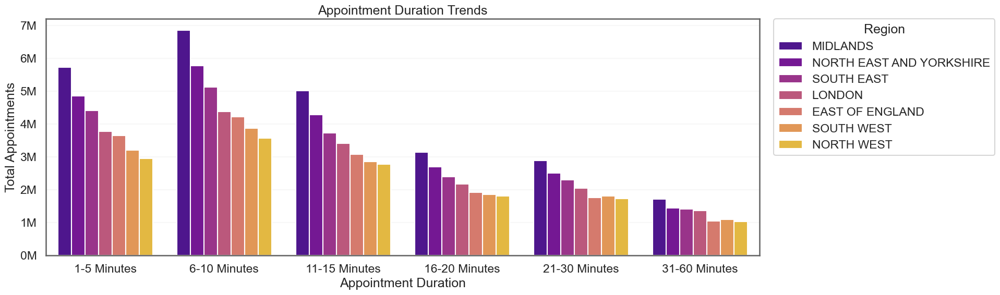

In [53]:
# Bar plot showing the sum of appointment durations by region.
# Use bar function
generate_barplot(df=ad_no_unknown,
                 x="actual_duration",
                 y="count_of_appointments",
                 title="Appointment Duration Trends",
                 xlab="Appointment Duration",
                 ylab="Total Appointments",
                 estimator=np.sum,
                 order=bar_order,
                 errorbar=None,
                 hue="Region Name",
                 hue_order=region_hue,
                 palette="plasma"
                )

# EXTRA FORMATTING NEEDED
# Change legend names, remove commissioning region.
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = [label.replace(" COMMISSIONING REGION", "") for label in labels]
plt.legend(handles,
           new_labels,
           title="Region",
           bbox_to_anchor=(1.02, 1),
           loc="upper left",
           borderaxespad=0
)

plt.show()

### Most appointments across all appointment durations are made in the Midlands. The trend for number of regional appointments is maintained for all durations. Longer durations become progressively less common across all regions.

#

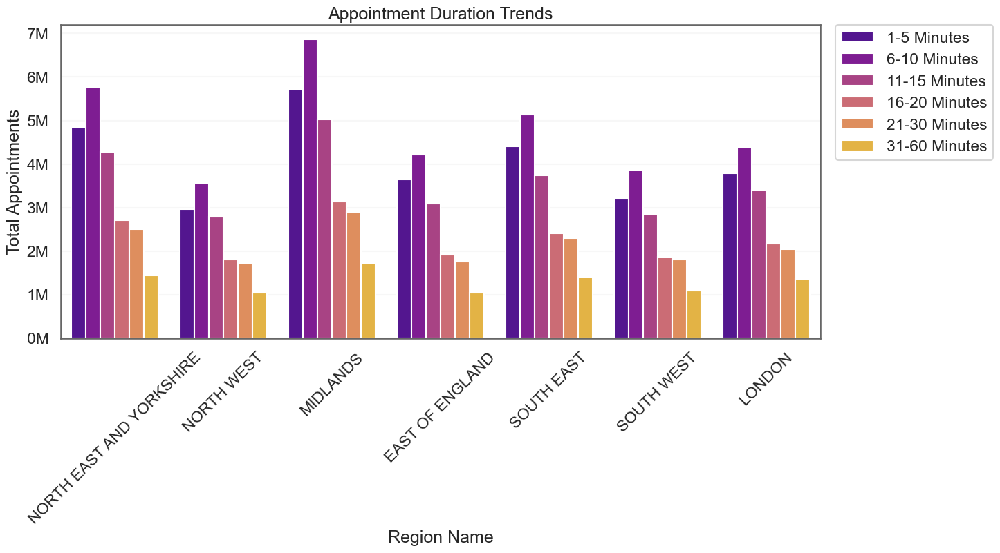

In [54]:
# Bar plot showing the sum of appointment durations by region, with appointment duration as hue.
# Use bar function
generate_barplot(df=ad_no_unknown,
                 x="Region Name",
                 y="count_of_appointments",
                 title="Appointment Duration Trends",
                 xlab="Region Name",
                 ylab="Total Appointments",
                 estimator=np.sum,
                 errorbar=None,
                 hue="actual_duration",
                 hue_order=bar_order,
                 palette="plasma"
                )

# EXTRA FORMATTING NEEDED
# Change legend title.
plt.legend(title="Appointment Duration") 

# Remove the commisioning group and assign to region_hue_trunc, this is to change x axis bar labels.
region_hue_trunc =["NORTH EAST AND YORKSHIRE",
                   "NORTH WEST",
                   "MIDLANDS",
                   "EAST OF ENGLAND",
                   "SOUTH EAST",
                   "SOUTH WEST",
                   "LONDON"]

# Use region_hue_trunc to change the x axis bar labels.
# Also rotate the text.
plt.xticks(ticks=range(len(region_hue_trunc)), labels=region_hue_trunc, rotation=45)

# Move the legend to be beside the plot.
plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0
)
plt.show()                

In [55]:
# Determine the top five locations based on appointment count, grouped by sub_icb for ad.
top5_ad_filtered = ad.groupby(
    ["sub_icb_location_name"])["count_of_appointments"]\
    .sum().sort_values(ascending=False).reset_index().iloc[0:5, :]

top5_ad_filtered

,sub_icb_location_name,count_of_appointments
0,NHS North West London ICB - W2U3Z,6976986
1,NHS North East London ICB - A3A8R,5341883
2,NHS Kent and Medway ICB - 91Q,5209641
3,NHS Hampshire and Isle Of Wight ICB - D9Y0V,4712737
4,NHS South East London ICB - 72Q,4360079


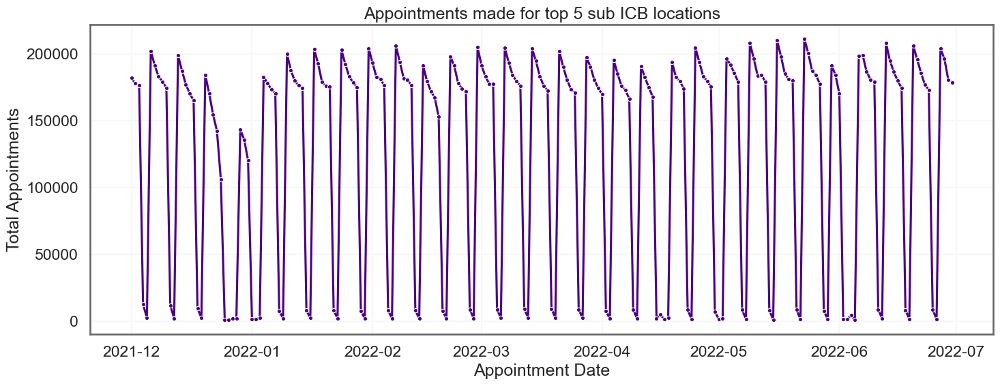

In [56]:
# Plot the count of appointments for the top 5 sub icb locations.
ad_top_subicb = ad[ad["sub_icb_location_name"].isin(top5_ad_filtered["sub_icb_location_name"])]

generate_lineplot(df=ad_top_subicb,
                  x="appointment_date",
                  y="count_of_appointments",
                  title="Appointments made for top 5 sub ICB locations",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  format_axis=None,
                  errorbar=None,
                  marker=".",
                  color="Indigo",
                  estimator=np.sum)
    
plt.show()

There are peaks and dips in the data. Which days are the dips?
Investigate this further with the full dataset below:

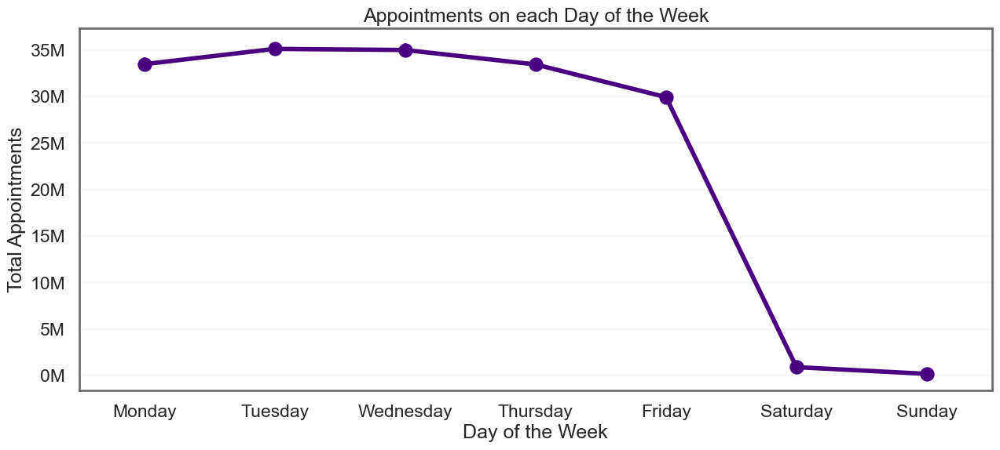

In [57]:
# Plot appointments per day Mon-Sun.
# Make a weekday column in ad.
ad["weekday"] = ad["appointment_date"].dt.day_name()

# Order of days to plot:
weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Plot the total appointments per day.
ad_week = sns.pointplot(data=ad,
                        x="weekday",
                        y="count_of_appointments",
                        estimator=np.sum,
                        color="Indigo",
                        order=weekday_order)

# Add labels.
ad_week.set_xlabel("Day of the Week")
ad_week.set_ylabel("Total Appointments")
ad_week.set_title("Appointments on each Day of the Week")

# Format y axis tick labels.
ad_week.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{int(x/1e6)}M"))

plt.show()

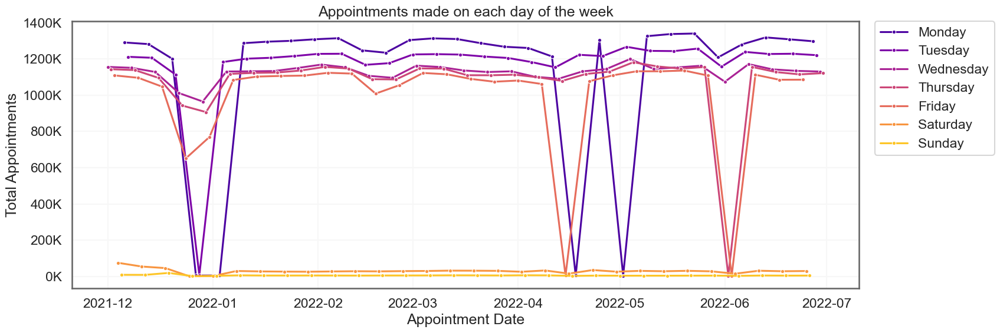

In [58]:
# Check the appointment counts over the date range in ad.
generate_lineplot(df=ad,
                  x="appointment_date",
                  y="count_of_appointments",
                  title="Appointments made on each day of the week",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="K",
                  errorbar=None,
                  marker=".",
                  hue="weekday",
                  hue_order=weekday_order,
                  estimator=np.sum,
                  palette="plasma"
                 )

# Move the legend to the side.
plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

plt.show()

From Online Research, the dips are:\
Mon 27, Tue 28 Dec 2021 (Christmas)\
Mon 3 Jan 2022 (New Year)\
Fri 15 Apr 2022 (Easter)\
Mon 18 Apr 2022 (Easter)\
Mon 2 May 2022 (Bank Holiday)\
Thu 2, Fri 3 Jun 2022 (Platinum Jubilee Bank Holiday)

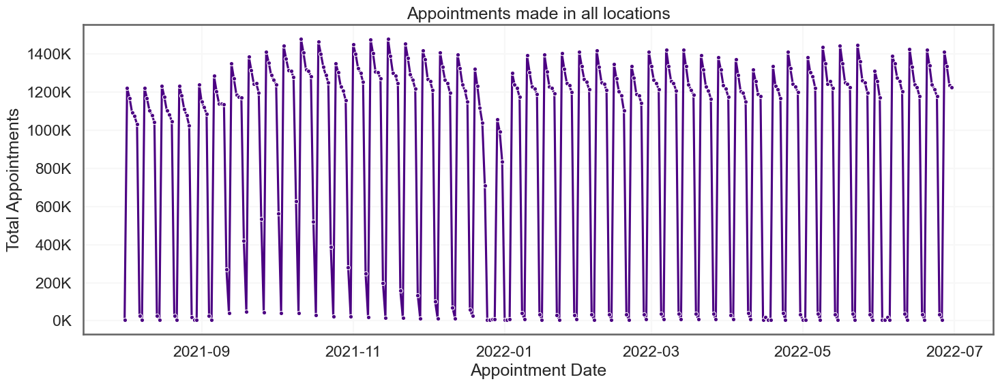

In [59]:
# The nc dataset contains data from a bigger range of dates.
# Plot to see if there is a similar trend with peaks and dips.

generate_lineplot(df=nc,
                  x="appointment_date",
                  y="count_of_appointments",
                  title="Appointments made in all locations",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="K",
                  errorbar=None,
                  marker=".",
                  color="Indigo",
                  estimator=np.sum)

plt.show()

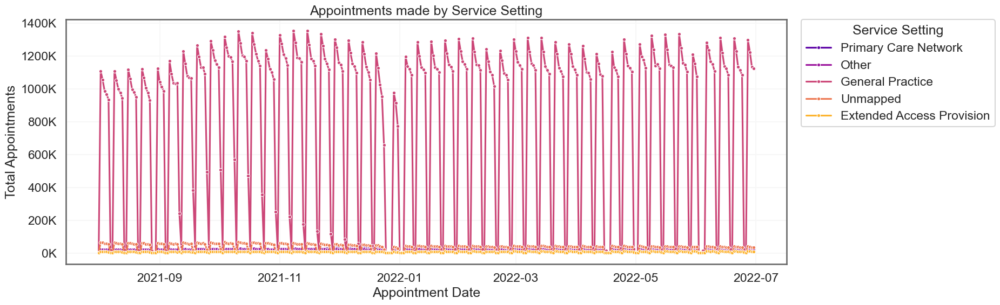

In [60]:
# Explore the data by service setting.

generate_lineplot(df=nc,
                  x="appointment_date",
                  y="count_of_appointments",
                  title="Appointments made by Service Setting",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="K",
                  hue="service_setting",
                  errorbar=None,
                  marker=".",
                  estimator=np.sum,
                  palette="plasma")
             
# Move the legend to the side.
plt.legend(
    title="Service Setting",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

plt.show()

The data is dominated by GP setting.

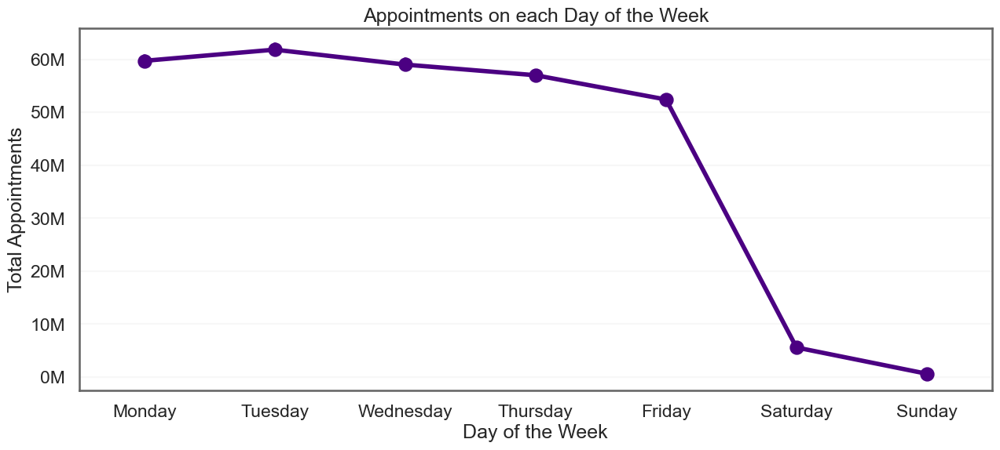

In [61]:
# Check the weekday trend is also present in nc.
# Make weekday column.
nc["weekday"] = nc["appointment_date"].dt.day_name()

weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

nc_week = sns.pointplot(data=nc,
                        x="weekday",
                        y="count_of_appointments",
                        estimator=np.sum,
                        order=weekday_order,
                        color="Indigo")

# Add labels
nc_week.set_xlabel("Day of the Week")
nc_week.set_ylabel("Total Appointments")
nc_week.set_title("Appointments on each Day of the Week")

# Format y axis tick labels.
nc_week.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{int(x/1e6)}M"))

plt.show()

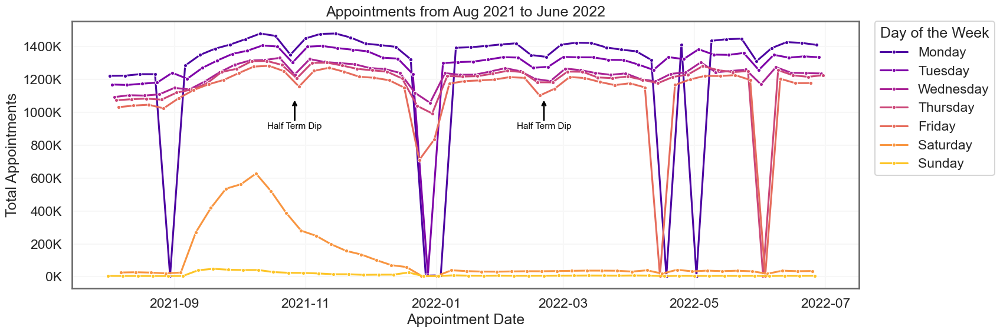

In [62]:
# View the data over the larger date range in nc by weekday.
generate_lineplot(df=nc,
                  x="appointment_date",
                  y="count_of_appointments",
                  title="Appointments from Aug 2021 to June 2022",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="K",
                  errorbar=None,
                  marker=".",
                  hue="weekday",
                  estimator=np.sum,
                  palette="plasma"
                  )

# Format legend.
plt.legend(
    title="Day of the Week",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Add two arrows.
arrow_style = dict(arrowstyle="->", color="black", lw=2, shrinkA=0, shrinkB=5)
# lw is arrow width.
# shrink are for spaceS on either end of the arrow.

# Multiple arrows so to avoid repeating code, use for loop.
for d in [dt.datetime(2021, 10, 27), dt.datetime(2022, 2, 20)]:
    plt.annotate(
        "Half Term Dip",
        xy=(d, 1_100_000),
        xytext=(d, 900_000),
        arrowprops=arrow_style,
        color="black",
        fontsize=11,
        ha="center")

plt.show()

The dips are the same as before, but with the addition of an Aug Bank Holiday:\
Mon 30 Aug 2021 (Bank Holiday)\
Mon 27, Tue 28 Dec 2021 (Christmas)\
Mon 3 Jan 2022 (New Year)\
Fri 15 Apr 2022 (Easter)\
Mon 18 Apr 2022 (Easter)\
Mon 2 May 2022 (Bank Holiday)\
Thu 2, Fri 3 Jun 2022 (Platinum Jubilee Bank Holiday)


### Saturday peak and dip
This is likely to be COVID-19 or flu vaccination appointments (many of which ran on Saturdays/Sundays in late 2021–early 2022)

### Dips in late Oct and late Feb?
These coincide with school half term breaks in the UK, there is no data for school summer holiday 2022-08, but would expect a similar dip as people go on holiday\
From the available data, we can see that it is in fact lower in 08-2021 than 07-2022.

Investigate the difference in 08-2021 and 07-2022

In [63]:
# Filter for 08-21 and 07-22.
nc_jul_aug = nc[(nc["appointment_date"] < "2021-08-30") | (nc["appointment_date"] > "2022-06-03")]


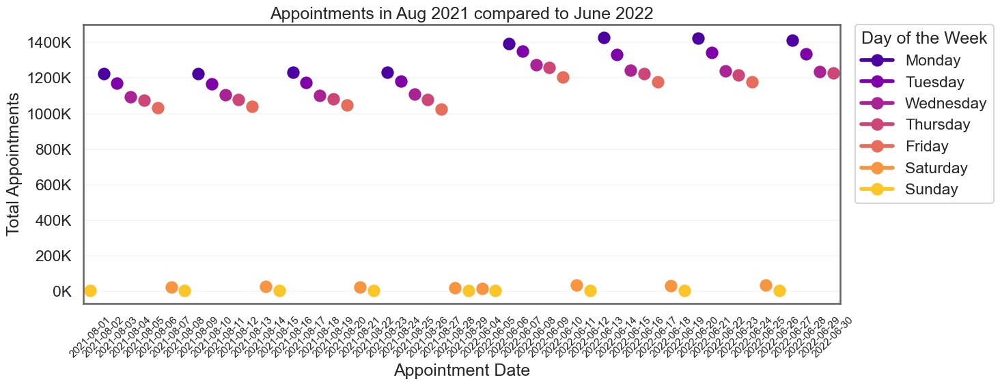

In [64]:
# Sort the values by appointment date to get a plot in date order.
nc_jul_aug_sorted = nc_jul_aug.sort_values("appointment_date")

# Plot
fig, ax = plt.subplots()

nc_jul_aug_plot = sns.pointplot(
    data=nc_jul_aug_sorted, 
    x="appointment_date", 
    y="count_of_appointments",
    hue="weekday",
    hue_order=weekday_order,
    estimator=np.sum,
    errorbar=None,
    palette="plasma")

# Add labels.
nc_jul_aug_plot.set_xlabel("Appointment Date")
nc_jul_aug_plot.set_ylabel("Total Appointments")
nc_jul_aug_plot.set_title("Appointments in Aug 2021 compared to June 2022")

# Format legend.
plt.legend(
    title="Day of the Week",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Rotate labels so they don't overlap.
plt.xticks(size=11,rotation=45)

# Format y axis tick labels.
nc_jul_aug_plot.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{int(x/1e3)}K"))

plt.tight_layout()
plt.show()

It is clearer from the above that there is a clear difference in the numbers of appointments during summer 2021-Aug and 2022-Jun, which is just before summer the next year.

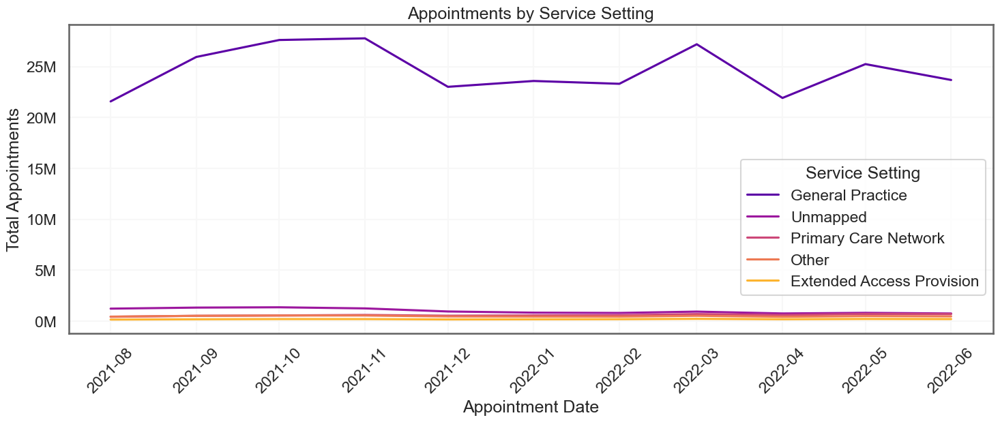

In [65]:
# Plot a line plot for appointments by service setting.
# Aggregate on a monthly level and determine the sum of records per month.
nc_ss = nc.groupby(["appointment_month", "service_setting"])["count_of_appointments"].sum().reset_index()

ss_order=["General Practice", "Unmapped", "Primary Care Network", "Other", "Extended Access Provision"]

# Plot the appointments over the available date range, and review the service settings for months.
# Create a lineplot.
generate_lineplot(df=nc_ss,
                  x="appointment_month",
                  y="count_of_appointments",
                  title="Appointments by Service Setting",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="M",
                  hue="service_setting",
                  hue_order = ss_order,
                  palette="plasma")

# Format legend.
plt.legend(
    title="Service Setting",
    loc="lower right",
    bbox_to_anchor=(1, 0.1))

# Rotate labels to prevent overlap.
plt.xticks(rotation=45)  

plt.show()

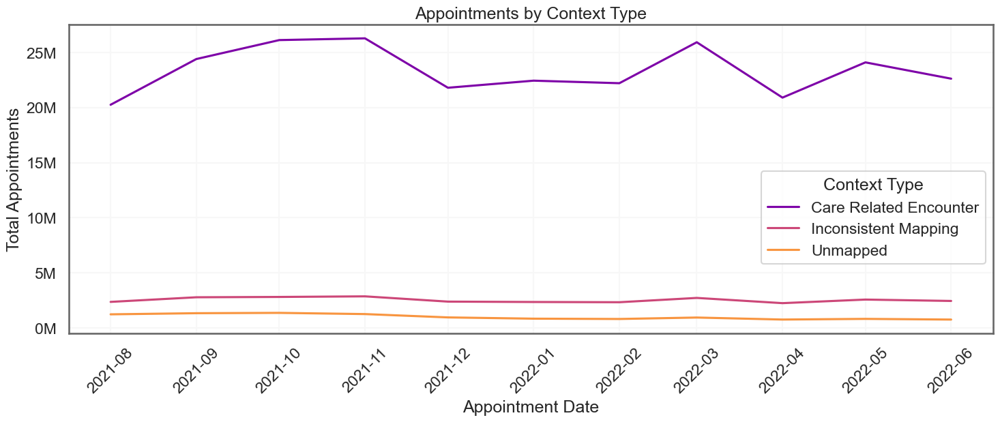

In [66]:
# Plot a line plot for appointments by context type.
nc_ct = nc.groupby(["appointment_month", "context_type"])["count_of_appointments"].sum().reset_index()

# Plot the appointments over the available date range, and review the context types for months.
# Create a lineplot.
generate_lineplot(df=nc_ct,
                  x="appointment_month",
                  y="count_of_appointments",
                  title="Appointments by Context Type",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="M",
                  hue="context_type",
                  palette="plasma") 

# Format legend.
plt.legend(
    title="Context Type",
    loc="lower right",
    bbox_to_anchor=(1, 0.2))

# Rotate labels so they don't overlap.
plt.xticks(rotation=45)

plt.show()

In [67]:
# Plot the data by national category.
# Remove inconsistent mapping and unmapped.
nc_filt = nc[~nc["national_category"].isin(["Inconsistent Mapping", "Unmapped"])].copy()

# Replace the spaces with a line break so the text shows up properly on the plot.
nc_filt.loc[:,"national_category_wrapped"] = nc_filt["national_category"].str.replace(" ", "<br>")


# Use a treemap, there are too many categories for a bar or line plot.
fig = px.treemap(
    nc_filt,
    path=["national_category_wrapped"],
    values="count_of_appointments",
    color="count_of_appointments",
    color_continuous_scale="plasma_r",
    title="Appointment Volume by National Category")

# Change text size and font colour.
fig.update_traces(textfont=dict(size=16, color="white")) 

fig.show()

In [68]:
# Show national categories as stacked line so the major categories with most appointments are clear.
# The categories with low values are not prominent so can focus on the bigger categories.

# groupby and sum.
nc_nc = nc_filt.groupby(["appointment_month", "national_category"])["count_of_appointments"].sum().reset_index()

# Plot the stacked line plot.
plt.figure(figsize=(10, 6))
fig = px.area(
    nc_nc,
    x="appointment_month",
    y="count_of_appointments",
    color="national_category",
    title="Monthly Trends in Appointment Categories"
)

# Change labels.
fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Number of Appointments")

fig.show()

<Figure size 1000x600 with 0 Axes>

In [69]:
# Sort national categories in descending order.
nc_nc_order = nc.groupby(["national_category"])["count_of_appointments"]\
.sum().reset_index()\
.sort_values(by="count_of_appointments", ascending=False)
nc_nc_order

,national_category,count_of_appointments
4,General Consultation Routine,97271522
3,General Consultation Acute,53691150
2,Clinical Triage,41546964
11,Planned Clinics,28019748
7,Inconsistent Mapping,27890802
10,Planned Clinical Procedure,25702694
15,Unmapped,11080810
16,Unplanned Clinical Activity,3055794
6,Home Visit,2144452
14,Structured Medication Review,1858379


In [70]:
# Combine rows 1-4 and 6 as top 5 (exclude inconsistent mapping).
subsettopnc = pd.concat([nc_nc_order.head(4), nc_nc_order.iloc[[5]]])

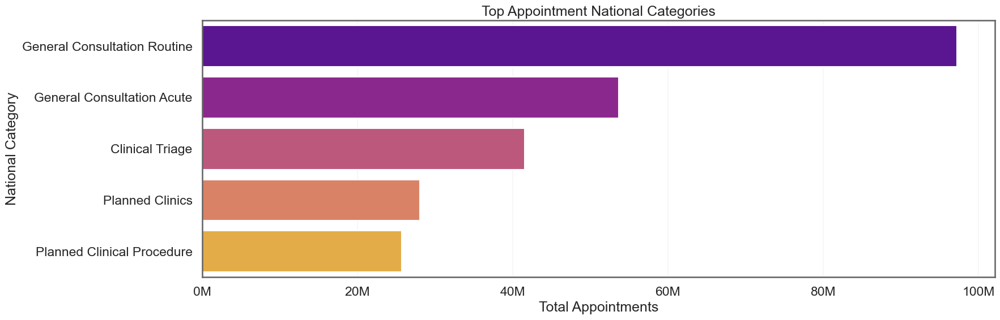

In [71]:
# Plot top 5.
# Use bar function.
plt.figure(figsize=(18,6))
generate_barplot(df=subsettopnc,
                 x="count_of_appointments",
                 y="national_category",
                 title="Top Appointment National Categories",
                 xlab="Total Appointments",
                 ylab="National Category",
                 format_axis="x",
                 estimator=np.sum,
                 hue="national_category",
                 palette="plasma"
                )
plt.show()

In [72]:
# See if sankey plot can show any meaningful insights: national categories and service setting.

# Set the figure size.
plt.figure(figsize=(18,12))

# Group the data.
df_grouped = nc_filt.groupby(
    ["service_setting", "national_category"])["count_of_appointments"].sum().reset_index()

# Set properties for plot.
sources = df_grouped["service_setting"]
targets = df_grouped["national_category"]
values = df_grouped["count_of_appointments"]

# Plot
fig = go.Figure(data=[go.Sankey(
    node=dict(label=list(set(sources) | set(targets))),
    link=dict(
        source=[list(set(sources) | set(targets)).index(s) for s in sources],
        target=[list(set(sources) | set(targets)).index(t) for t in targets],
        value=values))])

# Set title and font size.
fig.update_layout(title_text="Flow from Service Setting to National Category", font_size=10)

fig.show()

<Figure size 1800x1200 with 0 Axes>

The above may be too much information, try a heatmap.

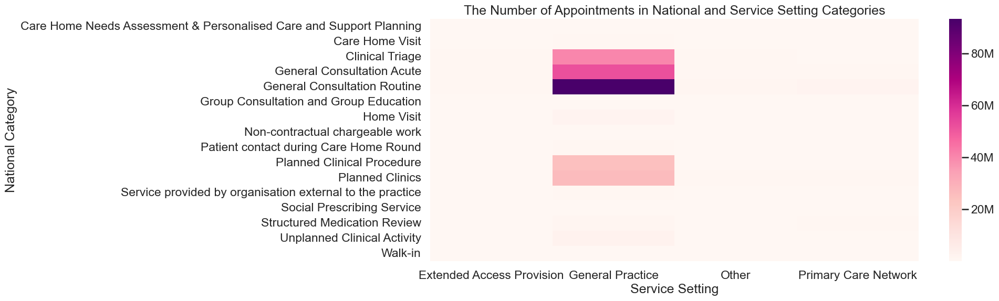

In [73]:
# Show the data with a heatmap.
heat = sns.heatmap(
    nc_filt.groupby(
        ["national_category", "service_setting"])["count_of_appointments"].sum().unstack(),
    cmap="RdPu")

# Set labels.
heat.set_xlabel("Service Setting")
heat.set_ylabel("National Category")
heat.set_title("The Number of Appointments in National and Service Setting Categories")

# Format the heatmap bar.
cbar = heat.collections[0].colorbar

# Use a FuncFormatter to convert numbers to M.
cbar.formatter = mtick.FuncFormatter(lambda x, pos: f"{int(x/1_000_000)}M")
cbar.update_ticks()

plt.show()

The heat map is much easier to understand. The GP service setting has the highest number of appointments and these are mostly routine general consulations.

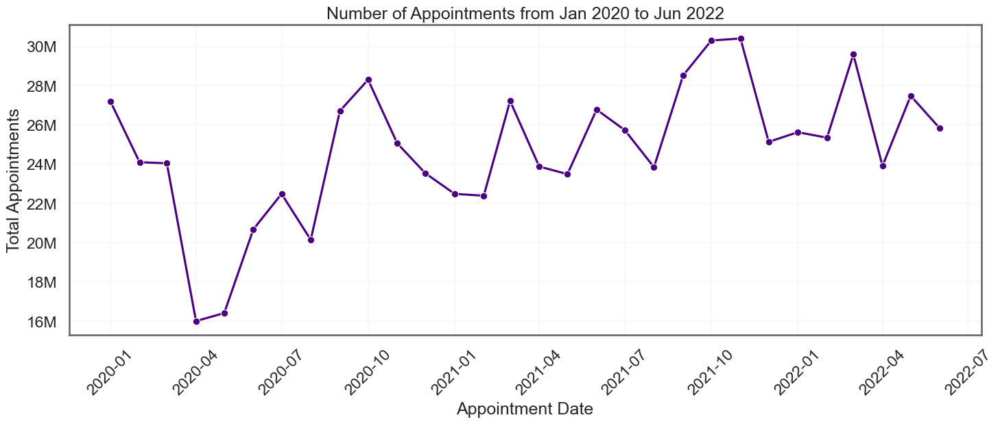

In [74]:
# Plot appointments over time.

generate_lineplot(df=ar_unique,
                  x="appointment_month",
                  y="count_of_appointments",
                  title="Number of Appointments from Jan 2020 to Jun 2022",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="M",
                  estimator=np.sum,
                  marker=".",
                  markersize=15,
                  color="Indigo",
                  errorbar=None) 

# Rotate the labels so they don't overlap.
plt.xticks(rotation=45)

plt.show()

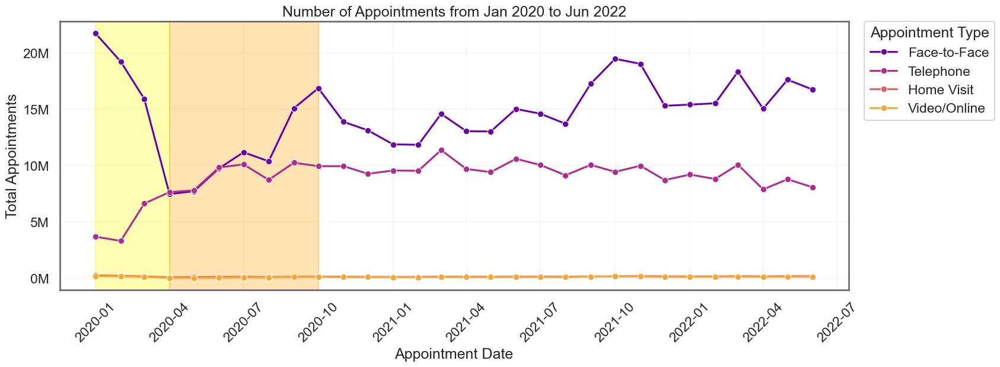

In [75]:
# Plot appointments over time for all appointment types/modes.
ar_unique_no_uk = ar_unique[ar_unique["appointment_mode"] != "Unknown"]

# Set order of colours.
hueorder = ["Face-to-Face", "Telephone", "Home Visit", "Video/Online"]

# Plot with function
generate_lineplot(df=ar_unique_no_uk,
                  x="appointment_month",
                  y="count_of_appointments",
                  title="Number of Appointments from Jan 2020 to Jun 2022",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="M",
                  estimator=np.sum,
                  marker=".",
                  markersize=15,
                  errorbar=None,
                  hue="appointment_mode",
                  hue_order=hueorder,
                  palette="plasma") 

# Highlight the area from Jan 2020 to Apr 2020.
start_highlight = pd.to_datetime("2020-01")
end_highlight   = pd.to_datetime("2020-04")
plt.axvspan(start_highlight, end_highlight, color="yellow", alpha=0.3)

# Highlight the area from Apr 2020 to Oct 2010.
start_highlight = pd.to_datetime("2020-04")
end_highlight   = pd.to_datetime("2020-10")
plt.axvspan(start_highlight, end_highlight, color="orange", alpha=0.3)

# Format the legend.
plt.legend(
    title="Appointment Type",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Rotate the labels.
plt.xticks(rotation=45)

plt.show()

The yellow region: COVID-19 pandemic and lockdown: Face-to-face appointments dropped and telephone appointments started to rise.\
The orange region: Lockdown ends, so face-to-face appointments go back up but telephone appointments stayed consistent due to convenience and a new preference.

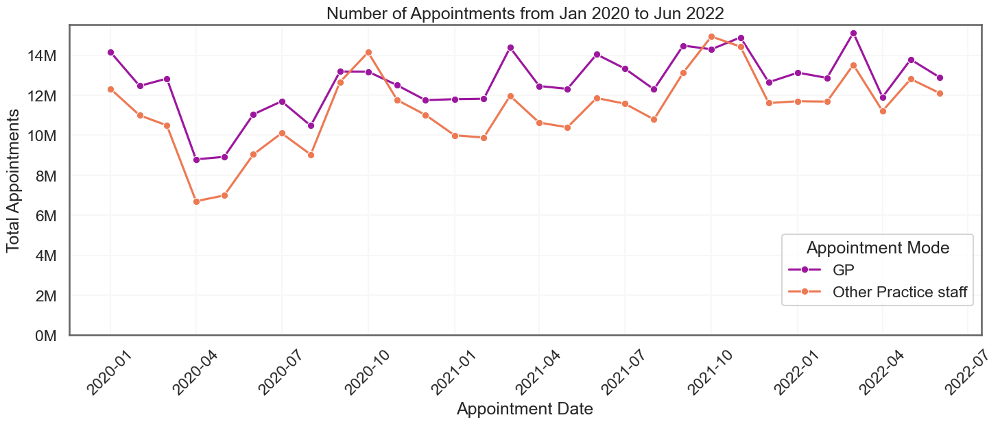

In [76]:
# Plot appointments based on hcp type.
ar_unique_hcp = ar_unique[ar_unique["hcp_type"] != "Unknown"]

# Lineplot with function
generate_lineplot(df=ar_unique_hcp,
                  x="appointment_month",
                  y="count_of_appointments",
                  title="Number of Appointments from Jan 2020 to Jun 2022",
                  xlab="Appointment Date",
                  ylab="Total Appointments",
                  scale="M",
                  estimator=np.sum,
                  marker=".",
                  markersize=15,
                  errorbar=None,
                  hue="hcp_type",
                  palette="plasma") 

# Format the legend.
plt.legend(
    title="Appointment Mode",
    loc="lower right",
    bbox_to_anchor=(1, 0.07))

# Set the y axis to start at zero.
plt.ylim(bottom=0)

# Rotate labels so they don't overlap.
plt.xticks(rotation=45)

plt.show()

How do the healthcare professional types differ over time?\
This dip above is from the COVID lockdown.

In [77]:
# ar_unique appointment mode.
# Filter first.
ar_unique_as = ar_unique[(ar_unique["appointment_status"] != "Unknown") & 
    (ar_unique["time_between_book_and_appointment"] != "Unknown / Data Quality") &
    (ar_unique["appointment_mode"].isin(["Face-to-Face", "Telephone"]))]

ar_unique_as_grouped = ar_unique_as.groupby(["time_between_book_and_appointment",
                                             "appointment_status","Region Name",
                                             "Integrated Care Board Name"])\
                                            ["count_of_appointments"].sum().reset_index()
ar_unique_as_grouped

,time_between_book_and_appointment,appointment_status,Region Name,Integrated Care Board Name,count_of_appointments
0,1 Day,Attended,EAST OF ENGLAND COMMISSIONING REGION,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",959315
1,1 Day,Attended,EAST OF ENGLAND COMMISSIONING REGION,NHS CAMBRIDGESHIRE AND PETERBOROUGH INTEGRATED...,909748
2,1 Day,Attended,EAST OF ENGLAND COMMISSIONING REGION,NHS HERTFORDSHIRE AND WEST ESSEX INTEGRATED CA...,1306717
3,1 Day,Attended,EAST OF ENGLAND COMMISSIONING REGION,NHS MID AND SOUTH ESSEX INTEGRATED CARE BOARD,1171893
4,1 Day,Attended,EAST OF ENGLAND COMMISSIONING REGION,NHS NORFOLK AND WAVENEY INTEGRATED CARE BOARD,1123493
...,...,...,...,...,...
583,Same Day,DNA,SOUTH WEST COMMISSIONING REGION,NHS CORNWALL AND THE ISLES OF SCILLY INTEGRATE...,98605
584,Same Day,DNA,SOUTH WEST COMMISSIONING REGION,NHS DEVON INTEGRATED CARE BOARD,120910
585,Same Day,DNA,SOUTH WEST COMMISSIONING REGION,NHS DORSET INTEGRATED CARE BOARD,43999
586,Same Day,DNA,SOUTH WEST COMMISSIONING REGION,NHS GLOUCESTERSHIRE INTEGRATED CARE BOARD,39132


In [78]:
# Set the order from shortest to longest appointment lag.
time_app_order = ["Same Day",
                  "1 Day",
                  "2 to 7 Days",
                  "8  to 14 Days",
                  "15  to 21 Days",
                  "22  to 28 Days",
                  "More than 28 Days"]

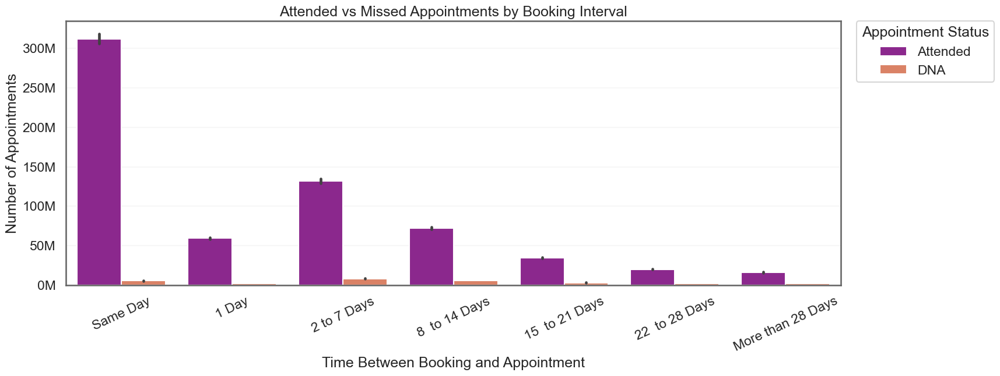

In [79]:
# Plot Attended and MIssed appointments by booking interval. 
# Use bar function.
generate_barplot(df=ar_unique_as,
                 x="time_between_book_and_appointment",
                 y="count_of_appointments",
                 title="Attended vs Missed Appointments by Booking Interval",
                 xlab="Time Between Booking and Appointment",
                 ylab="Number of Appointments",
                 hue="appointment_status",
                 estimator=np.sum,
                 order=time_app_order,
                 palette="plasma"
                )

# EXTRA FORMATTING.
# Format legend.
plt.legend(
    title="Appointment Status",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Rotate labels so they don't overlap.
plt.xticks(rotation=25)

plt.show()

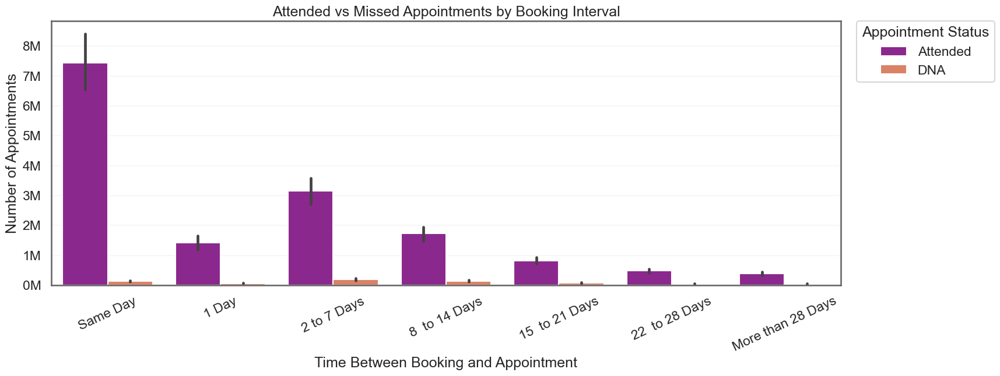

In [80]:
# Same as above but grouped data.
# Instead of total for all regions, it shows the total per icb region.
# The aggregation heirarchy:
""" Region Name
 ├── Integrated Care Board Name
 │    ├── time_between_book_and_appointment
 │    │    ├── appointment_status
 │    │    └── count_of_appointments (summed)
"""

generate_barplot(df=ar_unique_as_grouped,
                 x="time_between_book_and_appointment",
                 y="count_of_appointments",
                 title="Attended vs Missed Appointments by Booking Interval",
                 xlab="Time Between Booking and Appointment",
                 ylab="Number of Appointments",
                 hue="appointment_status",
                 order=time_app_order,
                 palette="plasma"
                )

# EXTRA FORMATTING.
# Format the legend.
plt.legend(
    title="Appointment Status",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Rotate labels so they don't overlap.
plt.xticks(rotation=25)

plt.show()

There's no clear relationship: see if using % reveals any insights.

In [81]:
# Unmelt using pivot.
ar_unique_as_grouped_pivot = ar_unique_as_grouped.pivot(
    index=["time_between_book_and_appointment",
           "Region Name",
           "Integrated Care Board Name"],
    columns="appointment_status",
    values="count_of_appointments").reset_index()

ar_unique_as_grouped_pivot.head()

appointment_status,time_between_book_and_appointment,Region Name,Integrated Care Board Name,Attended,DNA
0,1 Day,EAST OF ENGLAND COMMISSIONING REGION,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",959315,32666
1,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS CAMBRIDGESHIRE AND PETERBOROUGH INTEGRATED...,909748,32154
2,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS HERTFORDSHIRE AND WEST ESSEX INTEGRATED CA...,1306717,47853
3,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS MID AND SOUTH ESSEX INTEGRATED CARE BOARD,1171893,28897
4,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS NORFOLK AND WAVENEY INTEGRATED CARE BOARD,1123493,33531


In [82]:
# Add percent columns.
ar_unique_as_grouped_pivot["Percent Attended"] = ((ar_unique_as_grouped_pivot["Attended"])/
(ar_unique_as_grouped_pivot["Attended"] + ar_unique_as_grouped_pivot["DNA"])*100)

ar_unique_as_grouped_pivot["Percent DNA"] = ((ar_unique_as_grouped_pivot["DNA"])/
(ar_unique_as_grouped_pivot["Attended"] + ar_unique_as_grouped_pivot["DNA"])*100)

ar_unique_as_grouped_pivot.head()

appointment_status,time_between_book_and_appointment,Region Name,Integrated Care Board Name,Attended,DNA,Percent Attended,Percent DNA
0,1 Day,EAST OF ENGLAND COMMISSIONING REGION,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",959315,32666,96.706993,3.293007
1,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS CAMBRIDGESHIRE AND PETERBOROUGH INTEGRATED...,909748,32154,96.586269,3.413731
2,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS HERTFORDSHIRE AND WEST ESSEX INTEGRATED CA...,1306717,47853,96.467292,3.532708
3,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS MID AND SOUTH ESSEX INTEGRATED CARE BOARD,1171893,28897,97.593501,2.406499
4,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS NORFOLK AND WAVENEY INTEGRATED CARE BOARD,1123493,33531,97.101962,2.898038


In [83]:
# Melt back.
ar_unique_as_grouped_pivot_melt = pd.melt(
    ar_unique_as_grouped_pivot,
    id_vars=["time_between_book_and_appointment", "Region Name", "Integrated Care Board Name"],
    value_vars=["Percent Attended", "Percent DNA"],
    var_name="appointment_status_percent",
    value_name="count_of_appointments")

ar_unique_as_grouped_pivot_melt.head()

,time_between_book_and_appointment,Region Name,Integrated Care Board Name,appointment_status_percent,count_of_appointments
0,1 Day,EAST OF ENGLAND COMMISSIONING REGION,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",Percent Attended,96.706993
1,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS CAMBRIDGESHIRE AND PETERBOROUGH INTEGRATED...,Percent Attended,96.586269
2,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS HERTFORDSHIRE AND WEST ESSEX INTEGRATED CA...,Percent Attended,96.467292
3,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS MID AND SOUTH ESSEX INTEGRATED CARE BOARD,Percent Attended,97.593501
4,1 Day,EAST OF ENGLAND COMMISSIONING REGION,NHS NORFOLK AND WAVENEY INTEGRATED CARE BOARD,Percent Attended,97.101962


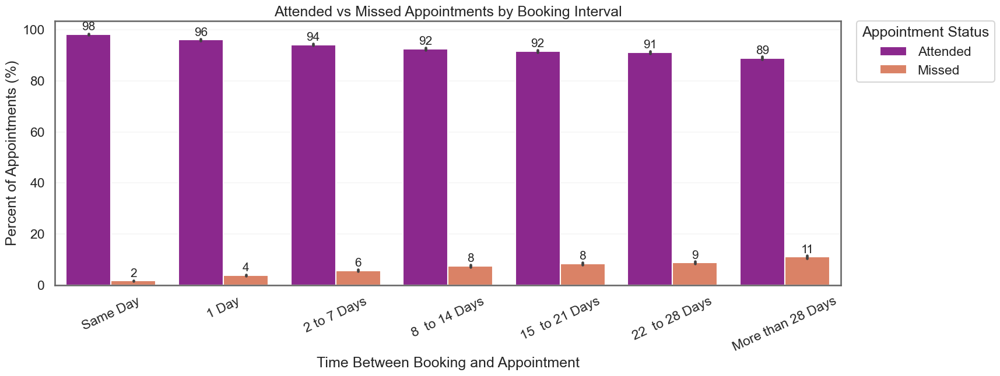

In [84]:
# Percent of attended/missed appointments by booking interval.

# Labels to be changed:
status_labels = {
    "Percent Attended": "Attended",
    "Percent DNA": "Missed",}

# Change labels.
ar_unique_as_grouped_pivot_melt["appointment_status_percent"] = (
    ar_unique_as_grouped_pivot_melt["appointment_status_percent"].replace(status_labels))

# Plot
bar = generate_barplot(df=ar_unique_as_grouped_pivot_melt,
                 x="time_between_book_and_appointment",
                 y="count_of_appointments",
                 title="Attended vs Missed Appointments by Booking Interval",
                 xlab="Time Between Booking and Appointment",
                 ylab="Percent of Appointments (%)",
                 format_axis=None,
                 hue="appointment_status_percent",
                 order=time_app_order,
                 palette="plasma"
                )

# EXTRA FORMATTING.
# Add labels on top of each bar.
for container in bar.containers:
    bar.bar_label(container, fmt="%.0f", padding=2, fontsize=15, rotation=0)

# Format the legend.
plt.legend(
    title="Appointment Status",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Rotate the labels so they don't overlap.
plt.xticks(rotation=25)

plt.show()

This shows a clear trend: as the time between booking and appointment increases, the precent of appointments attended declines.

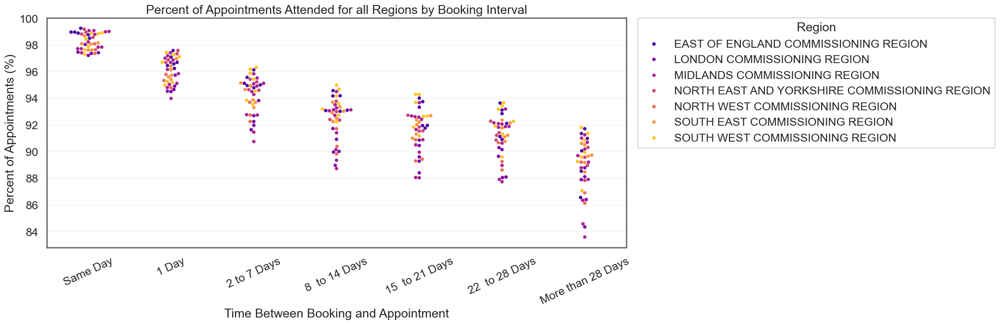

In [85]:
# View the percent attended by region.
as_perc_att = sns.swarmplot(ar_unique_as_grouped_pivot,
                      x="time_between_book_and_appointment",
                      y="Percent Attended",
                      hue="Region Name",
                      order=time_app_order, 
                      palette="plasma")
# Add labels.
as_perc_att.set_xlabel("Time Between Booking and Appointment")
as_perc_att.set_ylabel("Percent of Appointments (%)")
as_perc_att.set_title("Percent of Appointments Attended for all Regions by Booking Interval")

# Format legend.
plt.legend( title="Region",
           bbox_to_anchor=(1.02, 1),
           loc="upper left",
           borderaxespad=0)

# Rotate labels so they don't overlap.
plt.xticks(rotation=25)

plt.show()

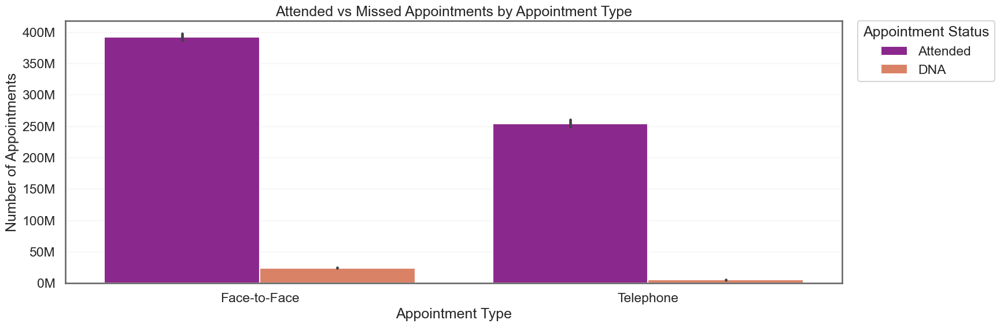

In [86]:
# Is there a relationship between missing appointments and the type of appointment?
generate_barplot(df=ar_unique_as,
                 x="appointment_mode",
                 y="count_of_appointments",
                 title="Attended vs Missed Appointments by Appointment Type",
                 xlab="Appointment Type",
                 ylab="Number of Appointments",
                 hue="appointment_status",
                 estimator=np.sum,
                 palette="plasma"
                )

# EXTRA FORMATTING
# Format legend.
plt.legend(
    title="Appointment Status",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

plt.show()

Should also do this as percentage:

In [87]:
# ar_unique appointment mode.
# Filter first.
ar_unique_as = ar_unique[(ar_unique["appointment_status"] != "Unknown") & 
    (ar_unique["time_between_book_and_appointment"] != "Unknown / Data Quality") &
    (ar_unique["appointment_mode"].isin(["Face-to-Face", "Telephone"]))]

ar_unique_as_grouped_mode = ar_unique_as.groupby(["appointment_mode", "appointment_status"])\
                                            ["count_of_appointments"].sum().reset_index()
ar_unique_as_grouped_mode

,appointment_mode,appointment_status,count_of_appointments
0,Face-to-Face,Attended,392531255
1,Face-to-Face,DNA,24207912
2,Telephone,Attended,254653350
3,Telephone,DNA,5230370


In [88]:
# Unmelt using pivot.
ar_unique_as_grouped_mode_pivot = ar_unique_as_grouped_mode.pivot(index="appointment_mode",\
columns="appointment_status", values="count_of_appointments").reset_index()
ar_unique_as_grouped_mode_pivot

appointment_status,appointment_mode,Attended,DNA
0,Face-to-Face,392531255,24207912
1,Telephone,254653350,5230370


In [89]:
# Add percent columns.
ar_unique_as_grouped_mode_pivot["Percent Attended"] = ((ar_unique_as_grouped_mode_pivot["Attended"])/
(ar_unique_as_grouped_mode_pivot["Attended"] + ar_unique_as_grouped_mode_pivot["DNA"])*100)

ar_unique_as_grouped_mode_pivot["Percent DNA"] = ((ar_unique_as_grouped_mode_pivot["DNA"])/
(ar_unique_as_grouped_mode_pivot["Attended"] + ar_unique_as_grouped_mode_pivot["DNA"])*100)

ar_unique_as_grouped_mode_pivot

appointment_status,appointment_mode,Attended,DNA,Percent Attended,Percent DNA
0,Face-to-Face,392531255,24207912,94.191112,5.808888
1,Telephone,254653350,5230370,97.987419,2.012581


In [90]:
# Melt back.
ar_unique_as_grouped_mode_pivot_melt = pd.melt(ar_unique_as_grouped_mode_pivot,
                                               id_vars="appointment_mode",
                                               value_vars=["Percent Attended", "Percent DNA"],
                                               var_name="appointment_status_percent",
                                               value_name="count_of_appointments")

ar_unique_as_grouped_mode_pivot_melt

,appointment_mode,appointment_status_percent,count_of_appointments
0,Face-to-Face,Percent Attended,94.191112
1,Telephone,Percent Attended,97.987419
2,Face-to-Face,Percent DNA,5.808888
3,Telephone,Percent DNA,2.012581


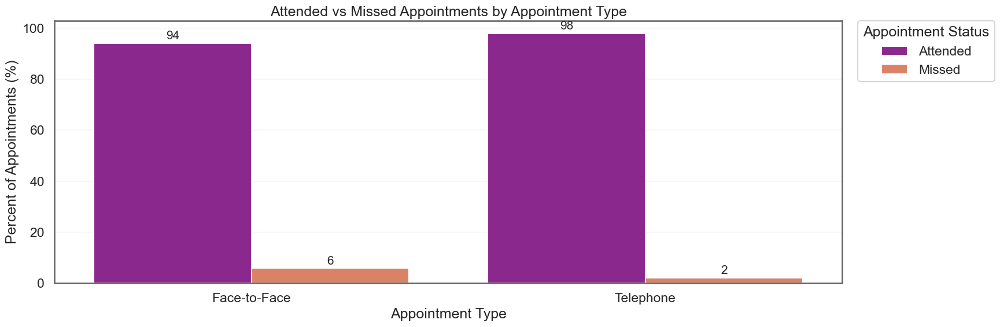

In [91]:
# Appointment type with percentage.

# Labels to change.
status_labels = {
    "Percent Attended": "Attended",
    "Percent DNA": "Missed",}

# Change the labels.
ar_unique_as_grouped_mode_pivot_melt["appointment_status_percent"] = (
    ar_unique_as_grouped_mode_pivot_melt["appointment_status_percent"].replace(status_labels))


bar = generate_barplot(df=ar_unique_as_grouped_mode_pivot_melt,
                 x="appointment_mode",
                 y="count_of_appointments",
                 title="Attended vs Missed Appointments by Appointment Type",
                 xlab="Appointment Type",
                 ylab="Percent of Appointments (%)",
                 format_axis=None,
                 hue="appointment_status_percent",
                 estimator=np.sum,
                 palette="plasma"
                )


# EXTRA FORMATTING
# Add labels on top of each bar.
for container in bar.containers:
    bar.bar_label(container, fmt="%.0f", padding=2, fontsize=15, rotation=0)

# Format legend.
plt.legend(
    title="Appointment Status",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

plt.show()

More appointments are missed if they are Face-to-Face.

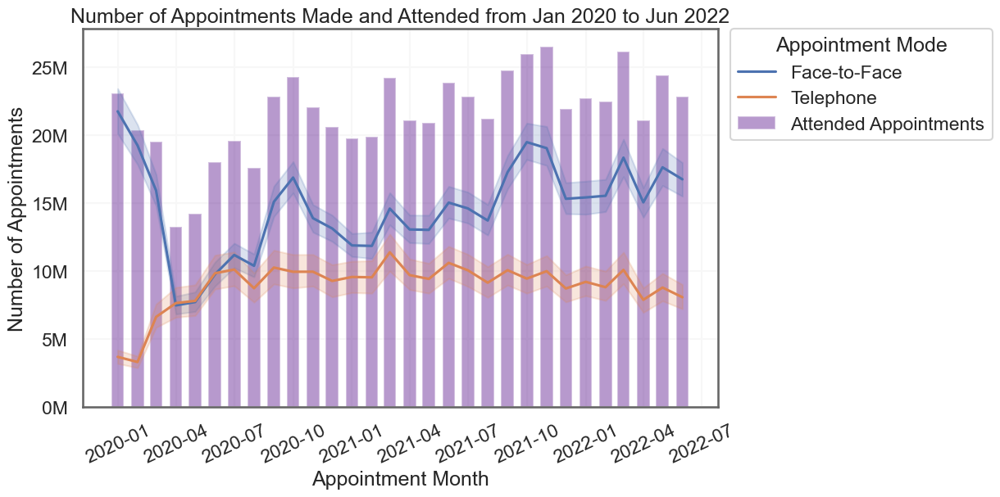

In [92]:
# Appointments attended over time.
# Select Attended only.
ar_attended_only = ar_unique[(ar_unique["appointment_status"] == "Attended") &(
    ar_unique["appointment_mode"].isin(["Face-to-Face", "Telephone"]))]

# Select F-2-F and Tel only.
mode_only = ar_unique[ar_unique["appointment_mode"].isin(["Face-to-Face", "Telephone"])]

# Group by month and count.
ar_unique_missed_time = ar_attended_only.groupby(
    ["appointment_month"])["count_of_appointments"].sum().reset_index()
ar_unique_missed_time.head()

# Plot
plt.figure(figsize=(10,6))

# Get current axes.
ax = plt.gca() 
# Plot bar.
ax.bar(
    ar_unique_missed_time["appointment_month"],
    ar_unique_missed_time["count_of_appointments"],
    color="indigo",
    alpha=0.4,
    width=20,
    label="Attended Appointments",
    zorder=1)

# Plot lines on top.
layer_plot = sns.lineplot(mode_only,
                    x="appointment_month",
                    y="count_of_appointments",
                    estimator=np.sum,
                    hue="appointment_mode",
                    ax=ax,
                    zorder=2)     

# Format y axis tick labels.
layer_plot.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{int(x/1e6)}M"))

# Add labels.
layer_plot.set_xlabel("Appointment Month")
layer_plot.set_ylabel("Number of Appointments")
layer_plot.set_title("Number of Appointments Made and Attended from Jan 2020 to Jun 2022")

# Format legend.
plt.legend(
    title="Appointment Mode",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

# Rotate labels so they don't overlap.
plt.xticks(rotation=25)

plt.show()

In [93]:
# In the busiest months, there are more face-to-face appointments.
# Telephone appointments are somewhat steady.

In [94]:
# Get percent of appointments facetoface or telephone for each ons location.
# Groupby month and appointment mode.
mode_ar = ar_unique_as.groupby(
    ["appointment_month","appointment_mode",
     "Integrated Care Board Name",
     "Region Name"])["count_of_appointments"].sum().reset_index()

mode_ar.tail()

,appointment_month,appointment_mode,Integrated Care Board Name,Region Name,count_of_appointments
2515,2022-06-01,Telephone,NHS STAFFORDSHIRE AND STOKE-ON-TRENT INTEGRATE...,MIDLANDS COMMISSIONING REGION,131766
2516,2022-06-01,Telephone,NHS SUFFOLK AND NORTH EAST ESSEX INTEGRATED CA...,EAST OF ENGLAND COMMISSIONING REGION,124007
2517,2022-06-01,Telephone,NHS SURREY HEARTLANDS INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION,125912
2518,2022-06-01,Telephone,NHS SUSSEX INTEGRATED CARE BOARD,SOUTH EAST COMMISSIONING REGION,250252
2519,2022-06-01,Telephone,NHS WEST YORKSHIRE INTEGRATED CARE BOARD,NORTH EAST AND YORKSHIRE COMMISSIONING REGION,324104


In [95]:
# Pivot
mode_ar_pivot = mode_ar.pivot(index=["appointment_month",
                                     "Integrated Care Board Name",
                                     "Region Name"],
                              columns="appointment_mode",
                              values="count_of_appointments").reset_index()

mode_ar_pivot.head()

appointment_mode,appointment_month,Integrated Care Board Name,Region Name,Face-to-Face,Telephone
0,2020-01-01,"NHS BATH AND NORTH EAST SOMERSET, SWINDON AND ...",SOUTH WEST COMMISSIONING REGION,375023,77075
1,2020-01-01,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",EAST OF ENGLAND COMMISSIONING REGION,357874,48679
2,2020-01-01,NHS BIRMINGHAM AND SOLIHULL INTEGRATED CARE BOARD,MIDLANDS COMMISSIONING REGION,489033,47192
3,2020-01-01,NHS BLACK COUNTRY INTEGRATED CARE BOARD,MIDLANDS COMMISSIONING REGION,539133,59706
4,2020-01-01,"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCEST...",SOUTH WEST COMMISSIONING REGION,369336,87216


In [96]:
# Calculate percentages.
mode_ar_pivot["F2F Percent"] = (mode_ar_pivot["Face-to-Face"]/
                                (mode_ar_pivot["Face-to-Face"] + mode_ar_pivot["Telephone"])*100)
mode_ar_pivot["Tel Percent"] = (mode_ar_pivot["Telephone"]/
                                (mode_ar_pivot["Face-to-Face"] + mode_ar_pivot["Telephone"])*100)

mode_ar_pivot.head()

appointment_mode,appointment_month,Integrated Care Board Name,Region Name,Face-to-Face,Telephone,F2F Percent,Tel Percent
0,2020-01-01,"NHS BATH AND NORTH EAST SOMERSET, SWINDON AND ...",SOUTH WEST COMMISSIONING REGION,375023,77075,82.951705,17.048295
1,2020-01-01,"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES INTE...",EAST OF ENGLAND COMMISSIONING REGION,357874,48679,88.026407,11.973593
2,2020-01-01,NHS BIRMINGHAM AND SOLIHULL INTEGRATED CARE BOARD,MIDLANDS COMMISSIONING REGION,489033,47192,91.199217,8.800783
3,2020-01-01,NHS BLACK COUNTRY INTEGRATED CARE BOARD,MIDLANDS COMMISSIONING REGION,539133,59706,90.029707,9.970293
4,2020-01-01,"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCEST...",SOUTH WEST COMMISSIONING REGION,369336,87216,80.896809,19.103191


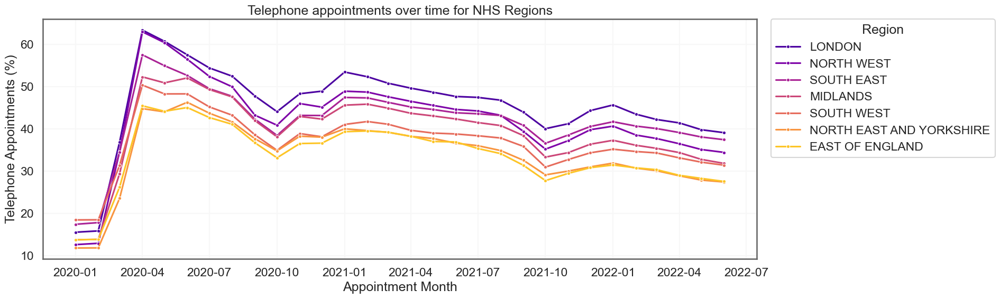

In [97]:
# Plot telephone appointments by region over time.
region_order = ["LONDON COMMISSIONING REGION",
    "NORTH WEST COMMISSIONING REGION",
    "SOUTH EAST COMMISSIONING REGION",
    "MIDLANDS COMMISSIONING REGION",
    "SOUTH WEST COMMISSIONING REGION",
    "NORTH EAST AND YORKSHIRE COMMISSIONING REGION",
    "EAST OF ENGLAND COMMISSIONING REGION"]

# Plot
generate_lineplot(df=mode_ar_pivot,
                  x="appointment_month",
                  y="Tel Percent",
                  title="Telephone appointments over time for NHS Regions",
                  xlab="Appointment Month",
                  ylab="Telephone Appointments (%)",
                  format_axis=None,
                  hue="Region Name",
                  hue_order=region_order,
                  errorbar=None,
                  palette="plasma",
                  marker=".")

# Change legend names, remove commissioning region.
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = [label.replace(" COMMISSIONING REGION", "") for label in labels]
plt.legend(handles, new_labels, title="Region",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

plt.show()

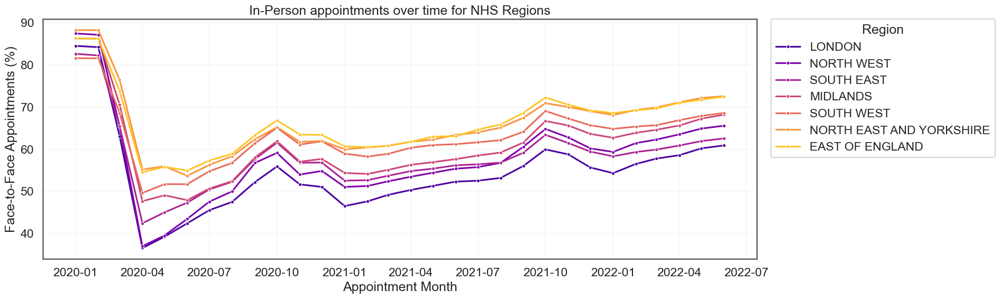

In [98]:
# Plot face to face appointments by region over time.
generate_lineplot(df=mode_ar_pivot,
                  x="appointment_month",
                  y="F2F Percent",
                  title="In-Person appointments over time for NHS Regions",
                  xlab="Appointment Month",
                  ylab="Face-to-Face Appointments (%)",
                  format_axis=None,
                  hue="Region Name",
                  hue_order=region_order,
                  errorbar=None,
                  palette="plasma",
                  marker=".")

# Change legend names, remove commissioning region.
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = [label.replace(" COMMISSIONING REGION", "") for label in labels]
plt.legend(handles, new_labels, title="Region",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0)

plt.show()

There is a clear shift from In-person to telephone appointments from Jan 2020 to Apr 2020. This co-incides with the COVID-19 lockdown. fter the lockdown, In-person appointments start to rise again and telephone appointments reduce, but they do not go back to pre-lockdown levels. London continues to have the highest percent of telephone appointments and the lowest percent of In-person appointments throughout the available time-frame.

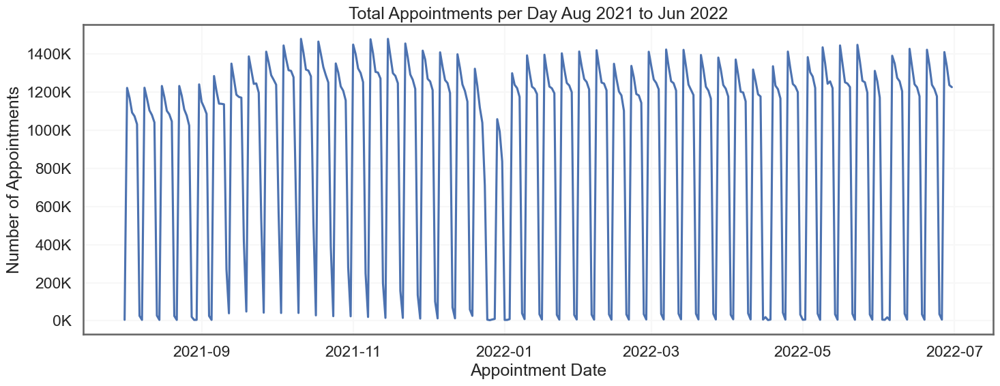

In [99]:
# 1.2 million appointments per day is the capacity.
# Check the number of appointments per day.
# nc dataset has full dates and bigger date range than ad.
generate_lineplot(df=nc,
                  x="appointment_date",
                  y="count_of_appointments",
                  title="Total Appointments per Day Aug 2021 to Jun 2022",
                  xlab="Appointment Date",
                  ylab="Number of Appointments",
                  scale="K",
                  estimator=np.sum,
                  errorbar=None)                         

plt.show()

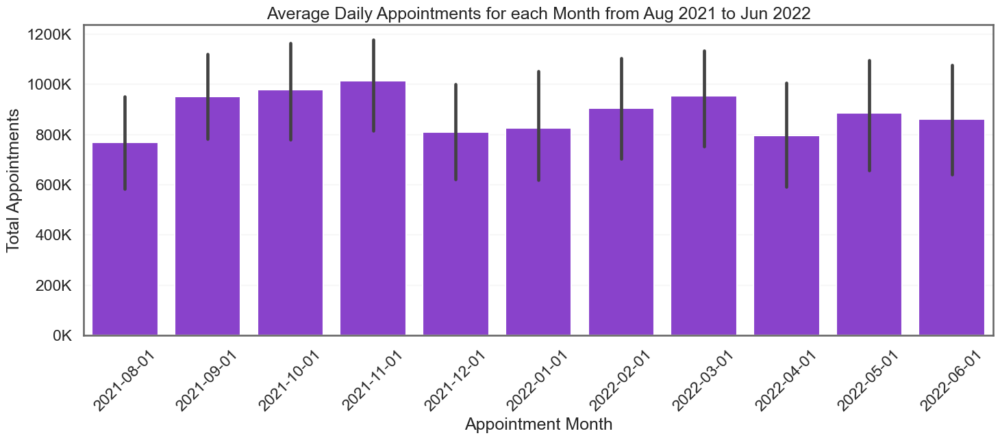

In [100]:
# Dataset nc - average appointments per day for each month with a barplot.

generate_barplot(
          df=nc.groupby(["appointment_month","appointment_date"], as_index=False)["count_of_appointments"].sum(),
          x="appointment_month",
          y="count_of_appointments",
          title="Average Daily Appointments for each Month from Aug 2021 to Jun 2022",
          xlab="Appointment Month",
          ylab="Total Appointments",
          scale="K",
          color="blueviolet"
                )

# Rotate labels.
plt.xticks(rotation=45)

plt.show()

### The above graph includes weekends and holidays and so is an under-representation of appointments per day.
### Looking at this, it would be assumed that the NHS is always working within maximum capacity.

In [101]:
""" need to remove weekends and holidays to get an accurate representation of capacity
    will remove weekends and the following dates:
Mon 30 Aug 2021
Mon 27, Tue 28 Dec 2021
Mon 3 Jan 2022
Fri 15 Apr 2022
Mon 18 Apr 2022
Mon 2 May 2022
Thu 2, Fri 3 Jun 2022 """

# List of holiday dates to exclude.
holidays = [
    "2021-08-30",  # Summer Bank Holiday
    "2021-12-27",  # Christmas (substitute)
    "2021-12-28",  # Boxing Day (substitute)
    "2022-01-03",  # New Year's Day (substitute)
    "2022-04-15",  # Good Friday
    "2022-04-18",  # Easter Monday
    "2022-05-02",  # Early May Bank Holiday
    "2022-06-02",  # Platinum Jubilee (Thursday)
    "2022-06-03",  # Platinum Jubilee (Friday)
]

# Filter weekdays and exclude holidays.
nc_work_days = nc[
    (nc["weekday"] != "Saturday")
    & (nc["weekday"] != "Sunday")
    & (~nc["appointment_date"].isin(pd.to_datetime(holidays)))]

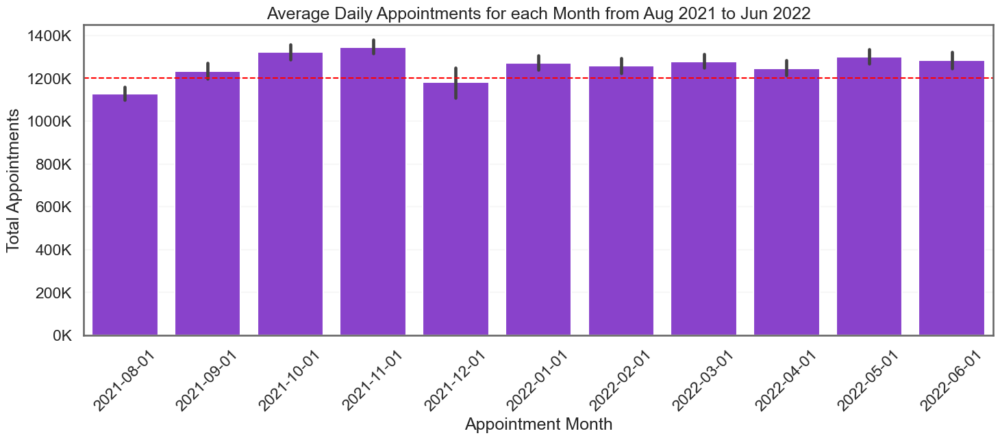

In [102]:
# Plot the filtered date bar
bar = generate_barplot(
          df=nc_work_days.groupby(
        ["appointment_month","appointment_date"], as_index=False)["count_of_appointments"].sum(),
          x="appointment_month",
          y="count_of_appointments",
          title="Average Daily Appointments for each Month from Aug 2021 to Jun 2022",
          xlab="Appointment Month",
          ylab="Total Appointments",
          scale="K",
          color="blueviolet"
                      )

# Plot 1.2 million line.
bar.axhline(1_200_000, color="red", linestyle="--", linewidth=1.5)

# Rotate the labels.
plt.xticks(rotation=45)

plt.show()

### The above graph is more accurate, it only shows days when NHS services are open

In [103]:
""" ar_unique data has a bigger range of dates.
However, there is no full date information, only month, so this is more difficult to calculate.
Need to get average appointments per day for each month, excluding weekends and holidays.
First aggregate by month, then divide by number of days in month (minus weekend). This is an estimate.
Picked 22 days because roughly 30 days in a month, and roughly 8 days are weekends.
"""
ar_month_estimate = ar_unique.groupby(["appointment_month"])["count_of_appointments"].sum().reset_index()

ar_month_estimate["app_day"] = ar_month_estimate["count_of_appointments"]/22

ar_month_estimate

,appointment_month,count_of_appointments,app_day
0,2020-01-01,27191758,1.235989e+06
1,2020-02-01,24097066,1.095321e+06
2,2020-03-01,24039635,1.092711e+06
3,2020-04-01,16002488,7.273858e+05
4,2020-05-01,16410591,7.459360e+05
5,2020-06-01,20678416,9.399280e+05
6,2020-07-01,22483207,1.021964e+06
7,2020-08-01,20143878,9.156308e+05
8,2020-09-01,26706462,1.213930e+06
9,2020-10-01,28296051,1.286184e+06


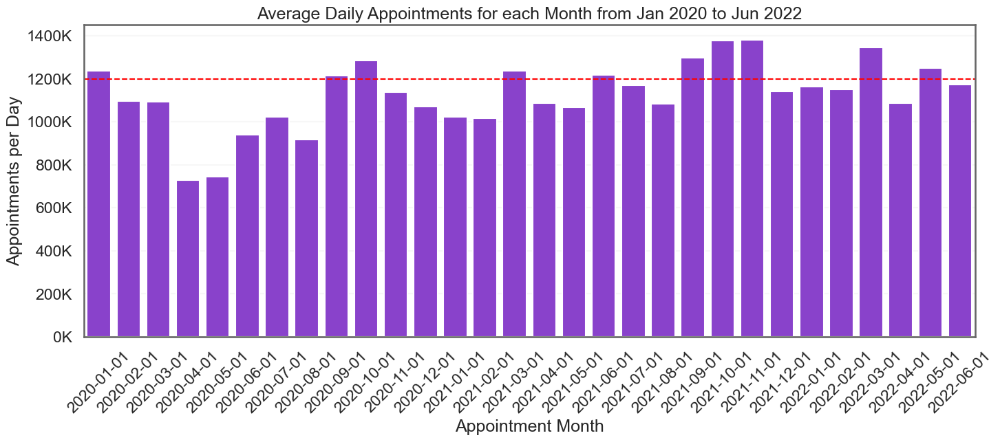

In [104]:
# Capacity from ar_unique dataset.
bar = generate_barplot(
          df=ar_month_estimate,
          x="appointment_month",
          y="app_day",
          title="Average Daily Appointments for each Month from Jan 2020 to Jun 2022",
          xlab="Appointment Month",
          ylab="Appointments per Day",
          scale="K",
          color="blueviolet"
                      )

# Plot 1.2 million line.
plt.axhline(1_200_000, color="red", linestyle="--", linewidth=1.5)

# Rotate x axis labels.
plt.xticks(rotation=45)

plt.show()

### The above graph is based on an estimate of the number of weekdays in a month but does not include public holidays.
### More precision is required.

In [105]:
# Exclude uk bank holidays and weekends from ar_unique with a function.

# Define UK bank holidays (NHS likely closed).
bank_holidays = pd.to_datetime([
    "2021-08-30",  # Summer Bank Holiday
    "2021-12-27", "2021-12-28",  # Christmas substitutes
    "2022-01-03",  # New Year substitute
    "2022-04-15", "2022-04-18",  # Good Friday & Easter Monday
    "2022-05-02",  # Early May Bank Holiday
    "2022-06-02", "2022-06-03",  # Platinum Jubilee
])

In [106]:
# Group the dataframe to get the necessary columns.
monthly_app = ar_unique.groupby(["appointment_month"])["count_of_appointments"].sum().reset_index()
monthly_app

,appointment_month,count_of_appointments
0,2020-01-01,27191758
1,2020-02-01,24097066
2,2020-03-01,24039635
3,2020-04-01,16002488
4,2020-05-01,16410591
5,2020-06-01,20678416
6,2020-07-01,22483207
7,2020-08-01,20143878
8,2020-09-01,26706462
9,2020-10-01,28296051


In [107]:
# Apply working_days_excl_holidays function to each month.
monthly_app["workdays_in_month"] = monthly_app["appointment_month"].apply(working_days_excl_holidays)
monthly_app

,appointment_month,count_of_appointments,workdays_in_month
0,2020-01-01,27191758,23
1,2020-02-01,24097066,20
2,2020-03-01,24039635,22
3,2020-04-01,16002488,22
4,2020-05-01,16410591,21
5,2020-06-01,20678416,22
6,2020-07-01,22483207,23
7,2020-08-01,20143878,21
8,2020-09-01,26706462,22
9,2020-10-01,28296051,22


In [108]:
# Calculate the average per working day.
monthly_app["avg_per_workday"] = monthly_app["count_of_appointments"] / monthly_app["workdays_in_month"]
monthly_app

,appointment_month,count_of_appointments,workdays_in_month,avg_per_workday
0,2020-01-01,27191758,23,1.182250e+06
1,2020-02-01,24097066,20,1.204853e+06
2,2020-03-01,24039635,22,1.092711e+06
3,2020-04-01,16002488,22,7.273858e+05
4,2020-05-01,16410591,21,7.814567e+05
5,2020-06-01,20678416,22,9.399280e+05
6,2020-07-01,22483207,23,9.775307e+05
7,2020-08-01,20143878,21,9.592323e+05
8,2020-09-01,26706462,22,1.213930e+06
9,2020-10-01,28296051,22,1.286184e+06


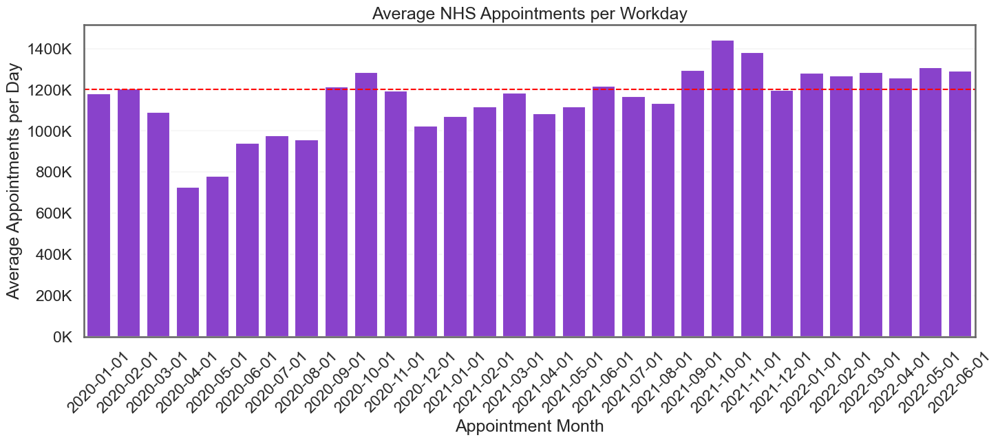

In [109]:
# Plot the precise graph.
generate_barplot(
          df=monthly_app,
          x="appointment_month",
          y="avg_per_workday",
          title="Average NHS Appointments per Workday",
          xlab="Appointment Month",
          ylab="Average Appointments per Day",
          scale="K",
          color="blueviolet"
                      )

# Plot 1.2 million line.
plt.axhline(1_200_000, color="red", linestyle="--", linewidth=1.5)

# Rotation.
plt.xticks(rotation=45)

plt.show()

#### Comparing to the nc dataset which was based on full dates and did not need calculations, Aug-2021 to Jun-2022 average appointments per day between the two graphs show the same trend. The same bars are above/below the 1.2M line. This gives me confidence that the earlier dates prior to Aug-2021 are accurate. 
#### This is good, but it can be improved.

In [110]:
# Prepare the df to plot the percent data diverging from capacity.
monthly_app["difference_from_1.2m"] = monthly_app["avg_per_workday"] - 1200000

monthly_app["percent"] = ((monthly_app["difference_from_1.2m"]/1200000)*100)

monthly_app.head()

,appointment_month,count_of_appointments,workdays_in_month,avg_per_workday,difference_from_1.2m,percent
0,2020-01-01,27191758,23,1.182250e+06,-17749.652174,-1.479138
1,2020-02-01,24097066,20,1.204853e+06,4853.300000,0.404442
2,2020-03-01,24039635,22,1.092711e+06,-107289.318182,-8.940777
3,2020-04-01,16002488,22,7.273858e+05,-472614.181818,-39.384515
4,2020-05-01,16410591,21,7.814567e+05,-418543.285714,-34.878607


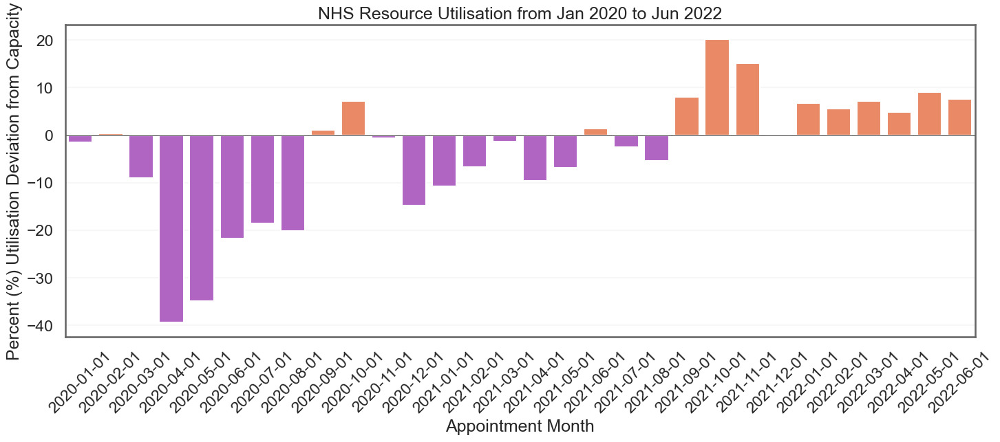

In [111]:
# Plot the bar graph.
# Positive values orange, negative violet.
colors = ["mediumorchid" if val <= 0 else "coral" for val in monthly_app["percent"]]

# Plot it.
generate_barplot(
          df=monthly_app,
          x="appointment_month",
          y="percent",
          title="NHS Resource Utilisation from Jan 2020 to Jun 2022",
          xlab="Appointment Month",
          ylab="Percent (%) Utilisation Deviation from Capacity",
          format_axis=None,
          hue="appointment_month",
          palette=colors
                      )
# y=0 line should be black.
plt.axhline(0, color="black", linewidth=0.5)

# Rotate ticks, assign to _ as otherwise will get a long list of values before the graph.
_ = plt.xticks(rotation=45)

### During COVID-19, the NHS was generally operating under maximum capacity, but has since been over-utilised from September 2021.

#

### Analysing Twitter Data

In [112]:
# Check retweet and favourite counts.
tweet["tweet_retweet_count"].value_counts()

tweet_retweet_count
0      526
1      215
2      114
3       70
5       35
4       27
7       18
12      16
8       15
73      14
9       13
208     12
6       12
35      10
11       6
37       6
53       5
10       5
63       4
44       4
150      4
207      3
85       3
62       3
41       3
76       3
68       3
78       2
23       2
72       2
16       2
24       2
39       1
40       1
14       1
303      1
57       1
54       1
19       1
79       1
20       1
48       1
49       1
13       1
107      1
15       1
169      1
Name: count, dtype: int64

In [113]:
tweet["tweet_favorite_count"].value_counts()

tweet_favorite_count
0     1027
1       91
2       16
3       13
4        7
5        5
6        2
28       1
14       1
18       1
11       1
9        1
20       1
7        1
13       1
8        1
10       1
12       1
17       1
42       1
Name: count, dtype: int64

##### A lot of the data has not been retweeted or favourited, so a lot would be missed if we only focused on these tweets.

In [114]:
# Check what the hashtags are in the tweets.

# Empty list to add hashtags to.
tags = []

# Loop through the messages, and create a list of values containing the # symbol.
# This will converts the tweet to string, only get characters after the hashtag, and wont include emojis.
for tweet_text in tweet["tweet_full_text"].values:
    tweet_text = str(tweet_text)
    hashtags = re.findall(r"#\w+", tweet_text)
    for h in hashtags:
        # Remove any non-alphanumeric characters except the #
        clean_h = re.match(r"#\w+", h).group(0)
        tags.append(clean_h.lower())

In [115]:
# Display the first 30 records.
tags = pd.Series(tags)
tags.head(30)

0                #healthcare
1             #premisehealth
2                    #hiring
3                #healthcare
4                       #new
5                     #blogs
6     #digitaltransformation
7             #cybersecurity
8                #accounting
9                   #finance
10               #healthcare
11            #firstcoastcna
12                  #cnaexam
13       #cnaexampreparation
14             #jacksonville
15              #cnatraining
16                    #nurse
17                  #nursing
18                #nurselife
19        #nursepractitioner
20            #nurseproblems
21            #nursingschool
22               #healthcare
23                      #new
24              #disparities
25               #healthcare
26                    #alert
27                #insurance
28                     #data
29               #healthcare
dtype: object

##### The hashtags look clean.

In [116]:
# Convert the series to a DataFrame in preparation for visualisation.
tags = pd.DataFrame(tags)

# Rename the columns.
tags.rename(columns={0: "word"}, inplace=True)
tags.head()

,word
0,#healthcare
1,#premisehealth
2,#hiring
3,#healthcare
4,#new


In [117]:
# Count the number of times each hashtag is used.
word_count = tags.groupby(["word"])["word"].value_counts().reset_index()
word_count.tail(30)

,word,count
1529,#womenshealth,2
1530,#womensrights,2
1531,#womensrightsarehumanrights,1
1532,#womenswellness,2
1533,#worcesterma,1
1534,#work,4
1535,#workerscomp,1
1536,#workerscomp411,1
1537,#workerscompensation,1
1538,#workersunite,4


In [118]:
# Display records where the count is larger than 10.
popular_tweets = word_count[word_count["count"] >10].sort_values("count", ascending=False).reset_index()
popular_tweets

,index,word,count
0,593,#healthcare,844
1,585,#health,88
2,44,#ai,47
3,884,#medicine,42
4,763,#job,38
5,858,#medical,35
6,1343,#strategy,31
7,405,#digitalhealth,31
8,1063,#pharmaceutical,28
9,893,#medtwitter,27


<Axes: xlabel='count', ylabel='word'>

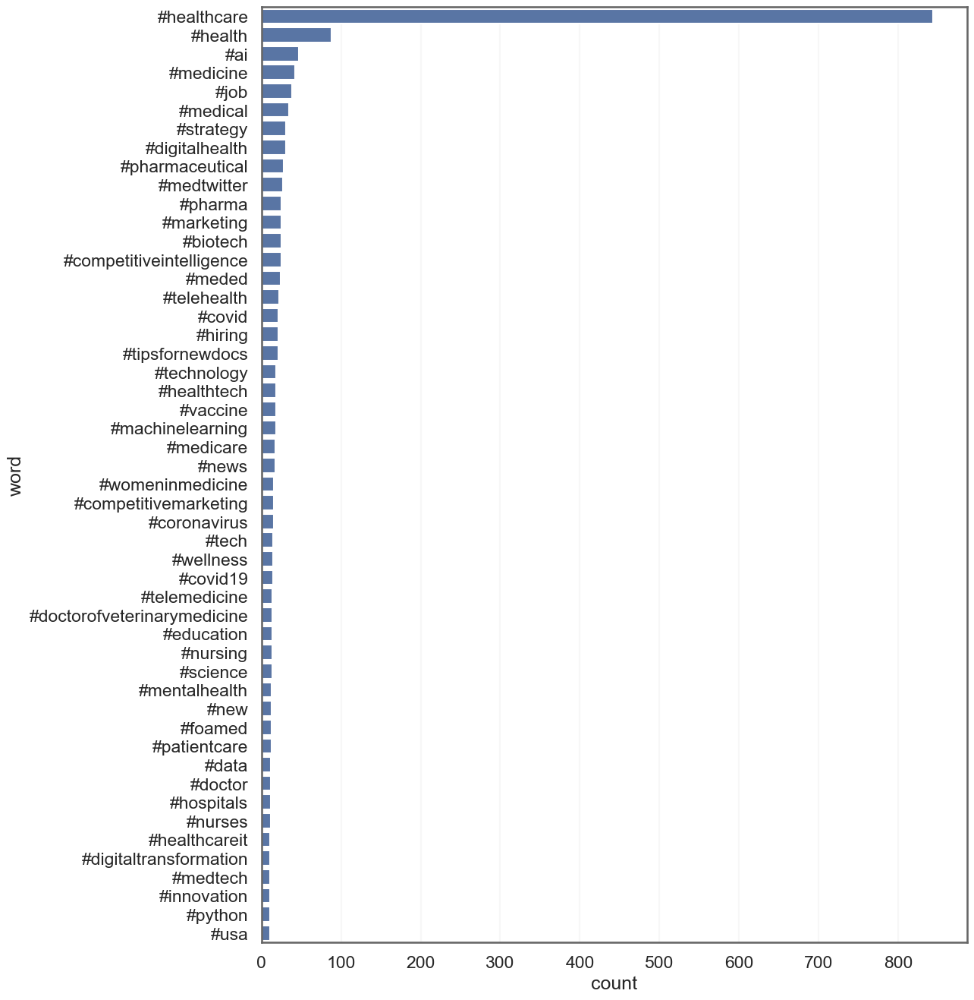

In [119]:
# Create a Seaborn barplot indicating records with a count >10 records.
plt.figure(figsize=(12, 16))
sns.barplot(popular_tweets, x="count", y="word")


It's quite difficult to get anything meaningful out of this,
the provided ar, nc, and ad data is a lot more descriptive and valuable.
The twitter data does not add a lot of value to the objectives of this project.

How to utilise tweets to provide feedback to the stakeholders?
The Twitter (X) data is noisy, incomplete, and not structured.
It would only hint at or give indirect signals as to what is happening.
The recorded appointments data gives clear evidence of capacity and the actual operation in the NHS.

Can it be justified to pay for sourcing the data?
The API is not free. I would suggest sticking to collecting and expanding on existing data.
